# Comp1-传统组学

主要适配于传统组学的建模和刻画。典型的应用场景探究rad_score最最终临床诊断的作用。

数据的一般形式为(具体文件,文件夹名可以不同)：
1. `images`文件夹，存放研究对象所有的CT、MRI等数据。
2. `masks`文件夹, 存放手工（Manuelly）勾画的ROI区域。与images文件夹的文件意义对应。
3. `label.txt`文件，每个患者对应的标签，例如肿瘤的良恶性、5年存活状态等。

## Onekey步骤

1. 数据校验，检查数据格式是否正确。
2. 组学特征提取，如果第一步检查数据通过，则提取对应数据的特征。
3. 读取标注数据信息。
4. 特征与标注数据拼接。形成数据集。
5. 查看一些统计信息，检查数据时候存在异常点。
6. 正则化，将数据变化到服从 N~(0, 1)。
7. 通过相关系数，例如spearman、person等筛选出特征。
8. 构建训练集和测试集，这里使用的是随机划分，正常多中心验证，需要大家根据自己的场景构建两份数据。
9. 通过Lasso筛选特征，选取其中的非0项作为后续模型的特征。
10. 使用机器学习算法，例如LR、SVM、RF等进行任务学习。
11. 模型结果可视化，例如AUC、ROC曲线，混淆矩阵等。


In [1]:
## 获得视频教程
import os
os.environ['DISABLE_VIDEO'] = 'TRUE'
from onekey_algo.custom.Manager import onekey_show
onekey_show('传统组学任务')

[2023-10-16 16:32:50 - Manager.py: 118]	INFO	播放视频功能已经设置成：Disable！


## 一、数据校验
首先需要检查诊断数据，如果显示`检查通过！`择可以正常运行之后的，否则请根据提示调整数据。

**注意**：这里要求images和masks文件夹中的文件名必须一一对应。e.g. `1.nii.gz`为images中的一个文件，在masks文件夹必须也存在一个`1.nii.gz`文件。

当然也可以使用自定义的函数，获取解析数据。

In [2]:
# 数据检验视频
onekey_show('传统组学任务|数据检验')

[2023-10-16 16:32:50 - Manager.py: 118]	INFO	播放视频功能已经设置成：Disable！


### 指定数据

此模块有3个需要自己定义的参数

1. `mydir`: 数据存放的路径。
2. `labelf`: 每个样本的标注信息文件。
3. `labels`: 要让AI系统学习的目标，例如肿瘤的良恶性、T-stage等。

In [3]:
import os
from IPython.display import display
os.environ['KMP_DUPLICATE_LIB_OK'] = 'TRUE'
from onekey_algo import OnekeyDS as okds
from onekey_algo import get_param_in_cwd

os.makedirs('img', exist_ok=True)
os.makedirs('results', exist_ok=True)
os.makedirs('features', exist_ok=True)

# 设置数据目录
task_type = 'Rad'
# mydir = r'你自己数据的路径'
mydir = get_param_in_cwd('radio_dir') or okds.ct
if mydir == okds.ct:
    print(f'正在使用Onekey数据：{okds.ct}，如果不符合预期，请修改目录位置！')
# 对应的标签文件
group_info = get_param_in_cwd('dataset_column') or 'group'
labelf = r'split_info/label-CV-0.csv'
# 读取标签数据列名
labels = [get_param_in_cwd('task_column') or 'label']

### images和masks匹配

这里要求images和masks文件夹中的文件名必须一一对应。e.g. `1.nii.gz`为images中的一个文件，在masks文件夹必须也存在一个`1.nii.gz`文件。

当然也可以使用自定义的函数，获取解析数据。

In [4]:
from pathlib import Path
from onekey_algo.custom.components.Radiology import diagnose_3d_image_mask_settings, get_image_mask_from_dir

# 生成images和masks对，一对一的关系。也可以自定义替换。
images, masks = get_image_mask_from_dir(mydir, images='images', masks='masks')

# 自定义获取images和masks数据的方法，下面的例子为，每个样本一个文件夹，图像是以im.nii结尾，mask是以seg.nii结尾。
# def get_images_mask(mydir):
#     images = []
#     masks = []
#     for root, dirs, files in os.walk(mydir):
#         for f in files:
#             if f.endswith('im.nii'):
#                 images.append(os.path.join(root, f))
#             if f.endswith('seg.nii'):
#                 masks.append(os.path.join(root, f))
#     return images, masks
# images, masks = get_images_mask(mydir)

# diagnose_3d_image_mask_settings(images, masks, verbose=True, assume_masks=[0, 1])
print(f'获取到{len(images)}个样本。')

获取到244个样本。


# 传统组学特征

使用pyradiomics提取传统组学特征，正常这块不需要修改，下面是具体的Onekey封装的接口。

```python
def extract(self, images: Union[str, List[str]], 
            masks: Union[str, List[str]], labels: Union[int, List[int]] = 1, settings=None)
"""
    * images: List结构，待提取的图像列表。
    * masks: List结构，待提取的图像对应的mask，与Images必须一一对应。
    * labels: 提取标注为什么标签的特征。默认为提取label=1的。
    * settings: 其他提取特征的参数。默认为None。

"""
```

```python
def get_label_data_frame(self, label: int = 1, column_names=None, images='images', masks='labels')
"""
    * label: 获取对应label的特征。
    * columns_names: 默认为None，使用程序设定的列名即可。
"""
```
    
```python
def get_image_mask_from_dir(root, images='images', masks='labels')
"""
    * root: 待提取特征的目录。
    * images: root目录中原始数据的文件夹名。
    * masks: root目录中标注数据的文件夹名。
"""
```


In [5]:
# 特征提取视频
onekey_show('传统组学任务|特征提取')

[2023-10-16 16:32:50 - Manager.py: 118]	INFO	播放视频功能已经设置成：Disable！


In [6]:
import warnings
import pandas as pd
 
warnings.filterwarnings("ignore")

from onekey_algo.custom.components.Radiology import ConventionalRadiomics

if os.path.exists('features/rad_features.csv'):
    rad_data = pd.read_csv('features/rad_features.csv', header=0)
else:
    # 如果要自定义一些特征提取方式，可以使用param_file。
    param_file = r'./custom_settings/exampleCT.yaml'
#     param_file = None
    radiomics = ConventionalRadiomics(param_file, correctMask=True)
    radiomics.extract(images, masks)
    rad_data = radiomics.get_label_data_frame(label=1)
    rad_data.columns = [c.replace('-', '_') for c in rad_data.columns]
    rad_data.to_csv('features/rad_features.csv', header=True, index=False)
rad_data

,ID,exponential_firstorder_10Percentile,exponential_firstorder_90Percentile,exponential_firstorder_Energy,exponential_firstorder_Entropy,exponential_firstorder_InterquartileRange,exponential_firstorder_Kurtosis,exponential_firstorder_Maximum,exponential_firstorder_Mean,exponential_firstorder_MeanAbsoluteDeviation,...,wavelet_LLL_glszm_LargeAreaLowGrayLevelEmphasis,wavelet_LLL_glszm_LowGrayLevelZoneEmphasis,wavelet_LLL_glszm_SizeZoneNonUniformity,wavelet_LLL_glszm_SizeZoneNonUniformityNormalized,wavelet_LLL_glszm_SmallAreaEmphasis,wavelet_LLL_glszm_SmallAreaHighGrayLevelEmphasis,wavelet_LLL_glszm_SmallAreaLowGrayLevelEmphasis,wavelet_LLL_glszm_ZoneEntropy,wavelet_LLL_glszm_ZonePercentage,wavelet_LLL_glszm_ZoneVariance
0,1.nii.gz,0.594,17.700,1.337e+10,1.944,8.902,110.915,318.995,7.263,7.141,...,9.809e-05,9.187e-05,12188.600,0.951,0.981,7.826e+05,9.131e-05,10.616,0.973,0.044
1,10.nii.gz,0.369,44.049,5.919e+09,2.509,11.628,200.850,2494.656,23.608,32.746,...,2.786e-04,2.358e-04,5265.227,0.960,0.985,7.592e+05,2.310e-04,10.499,0.979,0.025
2,100.nii.gz,0.603,36.611,8.465e+09,2.883,14.555,168.616,1474.129,19.942,22.744,...,1.310e-04,1.306e-04,7622.413,0.960,0.985,8.569e+05,1.305e-04,10.410,0.979,0.022
3,101.nii.gz,1.846,15.207,3.838e+09,1.925,5.966,48.602,135.446,7.405,5.153,...,2.837e-04,2.826e-04,3493.807,0.949,0.980,4.666e+05,2.823e-04,9.616,0.974,0.029
4,102.nii.gz,1.334,62.085,1.825e+10,3.380,16.901,144.825,3929.010,46.363,63.480,...,6.624e-05,6.612e-05,15309.930,0.973,0.990,1.108e+06,6.609e-05,10.541,0.986,0.014
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
239,95.nii.gz,2.209,130.896,1.310e+10,4.240,43.279,47.594,1651.342,50.877,55.584,...,9.816e-05,9.621e-05,10821.506,0.947,0.979,5.934e+05,9.573e-05,10.329,0.973,0.029
240,96.nii.gz,1.860,229.008,2.276e+10,4.053,62.509,67.478,3365.234,72.968,94.492,...,5.896e-05,5.842e-05,17401.823,0.935,0.974,9.662e+05,5.830e-05,10.727,0.965,0.039
241,97.nii.gz,0.128,7.239,1.480e+10,1.020,2.209,852.902,3402.220,8.016,12.266,...,3.619e-04,8.610e-05,12827.511,0.939,0.976,5.474e+05,8.554e-05,10.407,0.947,4.397
242,98.nii.gz,1.858,148.537,2.338e+10,4.572,52.478,123.781,3378.051,67.631,73.723,...,5.704e-05,5.644e-05,18812.081,0.961,0.985,1.123e+06,5.631e-05,10.562,0.979,0.023


## 特征统计

glcm          374
firstorder    306
glrlm         272
glszm         272
gldm          238
shape          14
dtype: int64

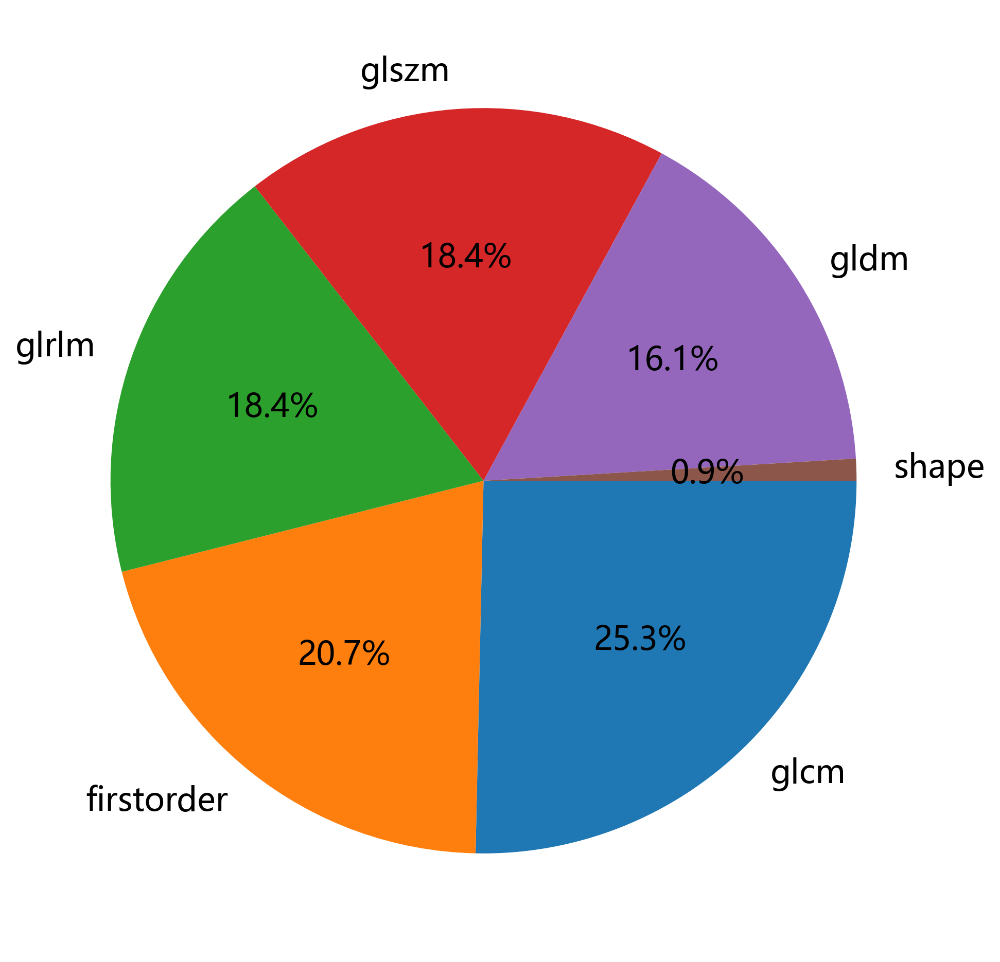

In [7]:
import matplotlib.pyplot as plt
sorted_counts = pd.DataFrame([c.split('_')[-2] for c in rad_data.columns if c !='ID']).value_counts()
plt.pie(sorted_counts, labels=[i[0] for i in sorted_counts.index], startangle=0,
        counterclock = False, autopct = '%.1f%%')
display(sorted_counts)
plt.savefig(f'img/Rad_feature_ratio.svg', bbox_inches = 'tight')

## 标注数据

数据以csv格式进行存储，这里如果是其他格式，可以使用自定义函数读取出每个样本的结果。

要求label_data为一个`DataFrame`格式，包括ID列以及后续的labels列，可以是多列，支持Multi-Task。

In [8]:
label_data = pd.read_csv(labelf)
label_data['ID'] = label_data['ID'].map(lambda x: f"{x}.nii.gz" if not (f"{x}".endswith('.nii.gz') or  f"{x}".endswith('.nii')) else x)
label_data = label_data[['ID', 'group'] + labels]
label_data.head()

,ID,group,label
0,1.nii.gz,train,0
1,2.nii.gz,train,1
2,3.nii.gz,train,1
3,5.nii.gz,train,1
4,6.nii.gz,train,1


## 特征拼接 

将标注数据`label_data`与`rad_data`进行合并，得到训练数据。

**注意：** 
1. 需要删掉ID这一列
2. 如果发现数据少了，需要自行检查数据是否匹配。

In [9]:
# 删掉ID这一列。
combined_data = pd.merge(rad_data, label_data, on=['ID'], how='inner')
ids = combined_data['ID']
combined_data = combined_data.drop(['ID'], axis=1)
print(combined_data[labels].value_counts())
combined_data

label
1        193
0         49
dtype: int64


,exponential_firstorder_10Percentile,exponential_firstorder_90Percentile,exponential_firstorder_Energy,exponential_firstorder_Entropy,exponential_firstorder_InterquartileRange,exponential_firstorder_Kurtosis,exponential_firstorder_Maximum,exponential_firstorder_Mean,exponential_firstorder_MeanAbsoluteDeviation,exponential_firstorder_Median,...,wavelet_LLL_glszm_SizeZoneNonUniformity,wavelet_LLL_glszm_SizeZoneNonUniformityNormalized,wavelet_LLL_glszm_SmallAreaEmphasis,wavelet_LLL_glszm_SmallAreaHighGrayLevelEmphasis,wavelet_LLL_glszm_SmallAreaLowGrayLevelEmphasis,wavelet_LLL_glszm_ZoneEntropy,wavelet_LLL_glszm_ZonePercentage,wavelet_LLL_glszm_ZoneVariance,group,label
0,0.594,17.700,1.337e+10,1.944,8.902,110.915,318.995,7.263,7.141,2.575,...,12188.600,0.951,0.981,7.826e+05,9.131e-05,10.616,0.973,0.044,train,0
1,0.369,44.049,5.919e+09,2.509,11.628,200.850,2494.656,23.608,32.746,2.229,...,5265.227,0.960,0.985,7.592e+05,2.310e-04,10.499,0.979,0.025,train,1
2,0.603,36.611,8.465e+09,2.883,14.555,168.616,1474.129,19.942,22.744,6.012,...,7622.413,0.960,0.985,8.569e+05,1.305e-04,10.410,0.979,0.022,test,1
3,1.846,15.207,3.838e+09,1.925,5.966,48.602,135.446,7.405,5.153,4.713,...,3493.807,0.949,0.980,4.666e+05,2.823e-04,9.616,0.974,0.029,train,1
4,1.334,62.085,1.825e+10,3.380,16.901,144.825,3929.010,46.363,63.480,8.110,...,15309.930,0.973,0.990,1.108e+06,6.609e-05,10.541,0.986,0.014,train,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
237,2.209,130.896,1.310e+10,4.240,43.279,47.594,1651.342,50.877,55.584,15.945,...,10821.506,0.947,0.979,5.934e+05,9.573e-05,10.329,0.973,0.029,train,1
238,1.860,229.008,2.276e+10,4.053,62.509,67.478,3365.234,72.968,94.492,8.888,...,17401.823,0.935,0.974,9.662e+05,5.830e-05,10.727,0.965,0.039,train,1
239,0.128,7.239,1.480e+10,1.020,2.209,852.902,3402.220,8.016,12.266,0.681,...,12827.511,0.939,0.976,5.474e+05,8.554e-05,10.407,0.947,4.397,train,1
240,1.858,148.537,2.338e+10,4.572,52.478,123.781,3378.051,67.631,73.723,23.856,...,18812.081,0.961,0.985,1.123e+06,5.631e-05,10.562,0.979,0.023,train,0


## 获取到数据的统计信息

1. count，统计样本个数。
2. mean、std, 对应特征的均值、方差
3. min, 25%, 50%, 75%, max，对应特征的最小值，25,50,75分位数，最大值。

In [10]:
combined_data.describe()

,exponential_firstorder_10Percentile,exponential_firstorder_90Percentile,exponential_firstorder_Energy,exponential_firstorder_Entropy,exponential_firstorder_InterquartileRange,exponential_firstorder_Kurtosis,exponential_firstorder_Maximum,exponential_firstorder_Mean,exponential_firstorder_MeanAbsoluteDeviation,exponential_firstorder_Median,...,wavelet_LLL_glszm_LowGrayLevelZoneEmphasis,wavelet_LLL_glszm_SizeZoneNonUniformity,wavelet_LLL_glszm_SizeZoneNonUniformityNormalized,wavelet_LLL_glszm_SmallAreaEmphasis,wavelet_LLL_glszm_SmallAreaHighGrayLevelEmphasis,wavelet_LLL_glszm_SmallAreaLowGrayLevelEmphasis,wavelet_LLL_glszm_ZoneEntropy,wavelet_LLL_glszm_ZonePercentage,wavelet_LLL_glszm_ZoneVariance,label
count,242.000,242.000,2.420e+02,242.000,242.000,242.000,242.000,242.000,242.000,242.000,...,2.420e+02,242.000,242.000,242.000,2.420e+02,2.420e+02,242.000,242.000,242.000,242.000
mean,0.942,63.686,9.588e+09,2.544,20.471,498.796,2067.384,29.194,35.523,7.224,...,2.553e-04,8081.588,0.949,0.980,7.819e+05,2.486e-04,10.168,0.964,19.377,0.798
std,1.517,77.586,7.150e+09,1.212,31.200,905.993,1248.467,30.204,35.422,12.181,...,1.950e-04,5912.891,0.029,0.012,3.563e+05,1.925e-04,0.390,0.042,179.005,0.403
min,0.052,1.067,8.925e+08,0.265,0.024,10.842,57.911,1.444,1.390,0.093,...,3.833e-05,795.619,0.767,0.896,1.692e+05,2.514e-05,8.379,0.608,0.008,0.000
25%,0.309,14.863,4.271e+09,1.619,4.205,92.243,1000.498,9.005,10.336,1.497,...,1.235e-04,3685.182,0.943,0.977,5.160e+05,1.125e-04,9.968,0.966,0.020,1.000
50%,0.473,37.948,7.075e+09,2.417,9.857,174.360,2129.745,20.289,24.529,3.582,...,2.001e-04,5928.911,0.957,0.983,7.479e+05,1.929e-04,10.174,0.977,0.025,1.000
75%,0.959,85.196,1.365e+10,3.385,23.580,457.985,2954.075,38.399,48.155,7.150,...,3.310e-04,11810.464,0.965,0.987,9.653e+05,3.221e-04,10.440,0.982,0.045,1.000
max,16.333,563.478,3.288e+10,5.897,250.964,7460.354,5325.037,223.875,235.407,99.559,...,1.221e-03,27847.631,0.985,0.994,1.989e+06,1.221e-03,10.997,0.992,2622.511,1.000


## 正则化

`normalize_df` 为onekey中正则化的API，将数据变化到0均值1方差。正则化的方法为

$column = \frac{column - mean}{std}$

In [11]:
from onekey_algo.custom.components.comp1 import normalize_df
data = normalize_df(combined_data, not_norm=labels, group=group_info)
data = data.dropna(axis=1)
data.describe()

,exponential_firstorder_10Percentile,exponential_firstorder_90Percentile,exponential_firstorder_Energy,exponential_firstorder_Entropy,exponential_firstorder_InterquartileRange,exponential_firstorder_Kurtosis,exponential_firstorder_Maximum,exponential_firstorder_Mean,exponential_firstorder_MeanAbsoluteDeviation,exponential_firstorder_Median,...,wavelet_LLL_glszm_LowGrayLevelZoneEmphasis,wavelet_LLL_glszm_SizeZoneNonUniformity,wavelet_LLL_glszm_SizeZoneNonUniformityNormalized,wavelet_LLL_glszm_SmallAreaEmphasis,wavelet_LLL_glszm_SmallAreaHighGrayLevelEmphasis,wavelet_LLL_glszm_SmallAreaLowGrayLevelEmphasis,wavelet_LLL_glszm_ZoneEntropy,wavelet_LLL_glszm_ZonePercentage,wavelet_LLL_glszm_ZoneVariance,label
count,2.420e+02,2.420e+02,2.420e+02,2.420e+02,2.420e+02,2.420e+02,2.420e+02,2.420e+02,2.420e+02,2.420e+02,...,2.420e+02,2.420e+02,2.420e+02,2.420e+02,2.420e+02,2.420e+02,2.420e+02,2.420e+02,2.420e+02,242.000
mean,-2.202e-17,-6.239e-17,1.468e-17,8.808e-17,-6.606e-17,-3.670e-17,2.973e-16,1.395e-16,-2.936e-17,-1.468e-17,...,2.129e-16,1.762e-16,-9.763e-16,8.654e-15,-6.973e-17,-7.340e-17,1.145e-15,7.194e-16,-2.202e-17,0.798
std,9.979e-01,9.979e-01,9.979e-01,9.979e-01,9.979e-01,9.979e-01,9.979e-01,9.979e-01,9.979e-01,9.979e-01,...,9.979e-01,9.979e-01,9.979e-01,9.979e-01,9.979e-01,9.979e-01,9.979e-01,9.979e-01,9.979e-01,0.403
min,-6.904e-01,-8.610e-01,-1.230e+00,-1.846e+00,-9.222e-01,-5.465e-01,-1.602e+00,-1.022e+00,-9.769e-01,-6.547e-01,...,-1.292e+00,-1.232e+00,-6.032e+00,-6.429e+00,-1.710e+00,-1.292e+00,-4.520e+00,-8.000e+00,-1.865e-01,0.000
25%,-4.283e-01,-6.236e-01,-7.598e-01,-7.433e-01,-5.218e-01,-4.476e-01,-8.686e-01,-6.737e-01,-7.047e-01,-4.675e-01,...,-7.025e-01,-7.551e-01,-1.968e-01,-1.774e-01,-7.522e-01,-7.109e-01,-5.262e-01,2.888e-02,-1.123e-01,1.000
50%,-3.192e-01,-3.245e-01,-3.505e-01,-1.016e-01,-3.261e-01,-3.583e-01,5.589e-02,-3.206e-01,-3.208e-01,-3.219e-01,...,-3.081e-01,-3.676e-01,2.902e-01,3.002e-01,-9.851e-02,-2.933e-01,1.966e-02,3.061e-01,-1.122e-01,1.000
75%,1.741e-02,2.748e-01,6.132e-01,6.973e-01,8.959e-02,-4.126e-02,7.001e-01,3.065e-01,3.659e-01,-6.315e-03,...,4.198e-01,6.716e-01,5.714e-01,5.573e-01,5.613e-01,4.390e-01,7.721e-01,4.228e-01,-1.122e-01,1.000
max,9.943e+00,6.431e+00,3.336e+00,2.768e+00,6.917e+00,8.028e+00,2.373e+00,6.294e+00,5.644e+00,7.333e+00,...,4.585e+00,3.555e+00,1.243e+00,1.191e+00,3.313e+00,4.673e+00,2.179e+00,8.262e-01,1.304e+01,1.000


## 统计检验

通过ttest或者utest进行特征筛选。

**注意** ：此步骤不是论文的标配，所以用不用在自己的选择，可以通过修改pvalue的值进行调整，默认是0.05为显著。

In [12]:
import seaborn as sns
from onekey_algo.custom.components.stats import clinic_stats

stats = clinic_stats(data, stats_columns=list(data.columns[0:-2]), label_column=labels[0], 
                     continuous_columns=list(data.columns[0:-2]))
stats

,feature_name,-label=ALL,-label=0,-label=1,pvalue
0,exponential_firstorder_10Percentile,-0.00±1.00,-0.02±0.68,0.00±1.06,0.148
1,exponential_firstorder_90Percentile,-0.00±1.00,0.21±1.01,-0.05±0.99,0.034
2,exponential_firstorder_Energy,0.00±1.00,0.23±1.24,-0.06±0.92,0.366
3,exponential_firstorder_Entropy,0.00±1.00,0.24±0.97,-0.06±1.00,0.046
4,exponential_firstorder_InterquartileRange,-0.00±1.00,0.18±0.88,-0.04±1.02,0.015
...,...,...,...,...,...
1463,wavelet_LLL_glszm_SmallAreaHighGrayLevelEmphasis,-0.00±1.00,0.31±0.96,-0.08±0.99,0.004
1464,wavelet_LLL_glszm_SmallAreaLowGrayLevelEmphasis,-0.00±1.00,-0.05±1.05,0.01±0.99,0.297
1465,wavelet_LLL_glszm_ZoneEntropy,0.00±1.00,0.29±0.97,-0.07±0.99,0.015
1466,wavelet_LLL_glszm_ZonePercentage,0.00±1.00,0.16±0.94,-0.04±1.01,0.009


#### 输出特征分布的图

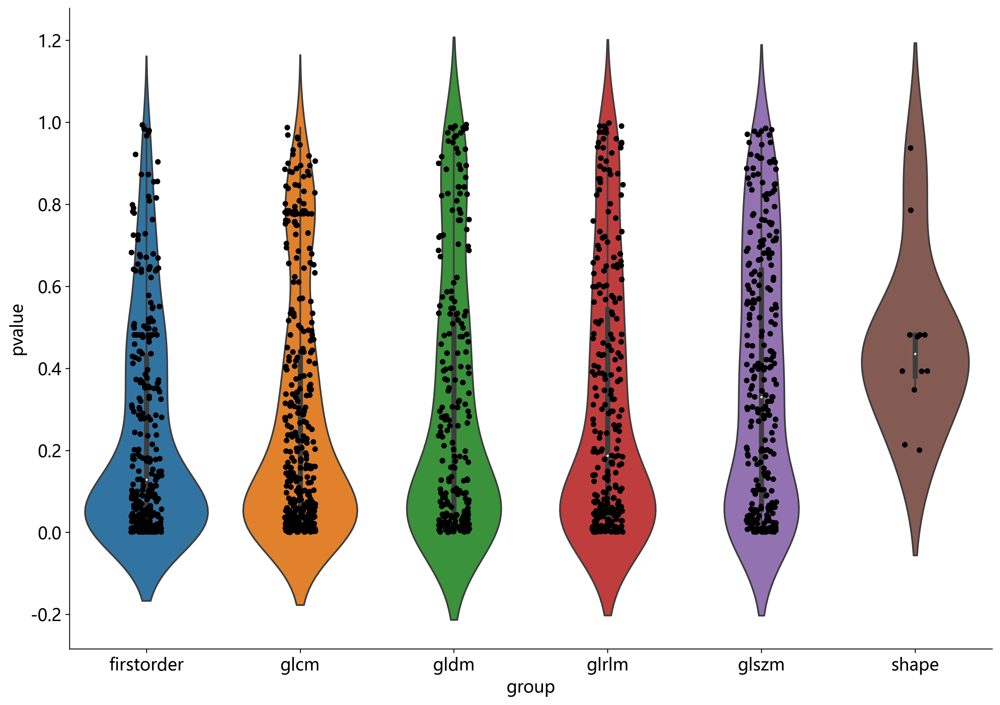

In [13]:
import matplotlib.pyplot as plt

def map2float(x):
    try:
        return float(str(x)[1:])
    except:
        return 1

stats[['pvalue']] = stats[['pvalue']].applymap(map2float)
stats[['group']] = stats[['feature_name']].applymap(lambda x: x.split('_')[-2])
stats = stats[['feature_name', 'pvalue', 'group']]
g = sns.catplot(x="group", y="pvalue", data=stats, kind="violin")
g.fig.set_size_inches(15,10)
sns.stripplot(x="group", y="pvalue", data=stats, ax=g.ax, color='black')
plt.savefig(f'img/Rad_feature_stats.svg', bbox_inches = 'tight')

#### 调整pvalue进行筛选。

In [14]:
pvalue = 0.05
sel_feature = list(stats[stats['pvalue'] < pvalue]['feature_name']) + labels + [group_info]
data = data[sel_feature]
data

,exponential_firstorder_90Percentile,exponential_firstorder_Entropy,exponential_firstorder_InterquartileRange,exponential_firstorder_Median,exponential_firstorder_RobustMeanAbsoluteDeviation,exponential_glcm_DifferenceAverage,exponential_glcm_DifferenceEntropy,exponential_glcm_Id,exponential_glcm_Idm,exponential_glcm_Idmn,...,wavelet_LLL_glszm_GrayLevelNonUniformityNormalized,wavelet_LLL_glszm_HighGrayLevelZoneEmphasis,wavelet_LLL_glszm_LargeAreaHighGrayLevelEmphasis,wavelet_LLL_glszm_SizeZoneNonUniformityNormalized,wavelet_LLL_glszm_SmallAreaEmphasis,wavelet_LLL_glszm_SmallAreaHighGrayLevelEmphasis,wavelet_LLL_glszm_ZoneEntropy,wavelet_LLL_glszm_ZonePercentage,label,group
2,-0.434,0.201,-0.256,-0.116,-0.373,-0.491,-0.052,-0.063,-0.064,0.377,...,-0.541,-0.022,-0.052,0.357,0.365,-0.026,0.329,0.413,1,test
10,-0.779,-0.963,-0.788,-0.267,-0.839,-0.980,-0.984,0.507,0.565,0.541,...,2.153,-1.099,-1.109,0.722,0.703,-1.096,-2.350,0.570,1,test
11,-0.609,-0.343,-0.626,-0.270,-0.679,-0.766,-0.520,0.401,0.418,0.823,...,-0.163,-0.163,-0.190,0.096,0.118,-0.167,0.066,0.291,1,test
14,0.414,0.913,0.769,0.199,0.645,0.429,0.620,-0.511,-0.517,-0.063,...,-0.915,0.446,0.423,0.005,0.028,0.436,1.040,0.233,1,test
15,0.258,0.836,0.612,0.195,0.437,0.365,0.784,-0.684,-0.694,0.455,...,-1.163,0.303,0.244,-0.022,-0.008,0.303,1.443,0.163,1,test
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
237,0.882,1.410,0.681,0.693,0.806,0.120,1.015,-1.162,-1.176,0.133,...,-0.317,-0.468,-0.224,-0.034,0.001,-0.483,0.492,0.202,1,train
238,2.141,1.257,1.258,0.132,1.876,0.545,0.846,-0.577,-0.542,0.229,...,-0.485,0.618,0.119,-0.436,-0.381,0.595,1.515,0.041,1,train
239,-0.704,-1.227,-0.552,-0.519,-0.621,-0.440,-1.001,1.054,1.052,0.441,...,-0.335,-0.618,-0.230,-0.305,-0.278,-0.616,0.692,-0.382,1,train
240,1.109,1.682,0.957,1.321,1.008,0.852,1.523,-1.552,-1.564,0.167,...,-0.422,1.048,0.222,0.424,0.419,1.048,1.089,0.354,0,train


### 相关系数

计算相关系数的方法有3种可供选择
1. pearson （皮尔逊相关系数）: standard correlation coefficient

2. kendall (肯德尔相关性系数) : Kendall Tau correlation coefficient

3. spearman (斯皮尔曼相关性系数): Spearman rank correlation

三种相关系数参考：https://blog.csdn.net/zmqsdu9001/article/details/82840332

In [15]:
# 相关系数视频
onekey_show('传统组学任务|相关系数')

[2023-10-16 16:32:59 - Manager.py: 118]	INFO	播放视频功能已经设置成：Disable！


In [16]:
pearson_corr = data[[c for c in data.columns if c not in labels]].corr('pearson')
# kendall_corr = data[[c for c in data.columns if c not in labels]].corr('kendall')
# spearman_corr = data[[c for c in data.columns if c not in labels]].corr('spearman')

### 相关系数可视化

通过修改变量名，可以可视化不同相关系数下的相关矩阵。

**注意**：当特征特别多的时候（大于100），尽量不要可视化，否则运行时间会特别长。

In [17]:
import seaborn as sns
from onekey_algo.custom.components.comp1 import draw_matrix
# plt.figure(figsize=(50.0, 40.0))

# # 选择可视化的相关系数
# draw_matrix(pearson_corr, annot=True, cmap='YlGnBu', cbar=False)
# plt.savefig(f'img/Rad_feature_corr.svg', bbox_inches = 'tight')

### 聚类分析

通过修改变量名，可以可视化不同相关系数下的相聚类分析矩阵。

注意：当特征特别多的时候（大于100），尽量不要可视化，否则运行时间会特别长。

In [18]:
import seaborn as sns
import matplotlib.pyplot as plt

# pp = sns.clustermap(pearson_corr, linewidths=.5, figsize=(50.0, 40.0), cmap='YlGnBu')
# plt.setp(pp.ax_heatmap.get_yticklabels(), rotation=0)
# plt.savefig(f'img/Rad_feature_cluster.svg', bbox_inches = 'tight')

### 特征筛选 -- 相关系数

根据相关系数，对于相关性比较高的特征（一般文献取corr>0.9），两者保留其一。

```python
def select_feature(corr, threshold: float = 0.9, keep: int = 1, topn=10, verbose=False):
    """
    * corr, 相关系数矩阵。
    * threshold，筛选的相关系数的阈值，大于阈值的两者保留其一（可以根据keep修改，可以是其二...）。默认阈值为0.9
    * keep，可以选择大于相关系数，保留几个，默认只保留一个。
    * topn, 每次去掉多少重复特征。
    * verbose，是否打印日志
    """
```

In [19]:
# 特征筛选视频
onekey_show('传统组学任务|特征筛选')

[2023-10-16 16:32:59 - Manager.py: 118]	INFO	播放视频功能已经设置成：Disable！


In [20]:
from onekey_algo.custom.components.comp1 import select_feature
sel_feature = select_feature(pearson_corr, threshold=0.9, topn=64, verbose=False)
sel_feature = sel_feature + labels + [group_info]
sel_feature

['exponential_firstorder_Median',
 'exponential_firstorder_RobustMeanAbsoluteDeviation',
 'exponential_glcm_DifferenceAverage',
 'exponential_glcm_Idmn',
 'exponential_glcm_Idn',
 'exponential_glcm_Imc1',
 'exponential_gldm_DependenceNonUniformityNormalized',
 'exponential_glrlm_RunVariance',
 'exponential_glszm_ZonePercentage',
 'gradient_firstorder_10Percentile',
 'gradient_firstorder_Uniformity',
 'gradient_glcm_Correlation',
 'gradient_glszm_SmallAreaLowGrayLevelEmphasis',
 'lbp_3D_m1_firstorder_10Percentile',
 'lbp_3D_m1_glrlm_GrayLevelNonUniformityNormalized',
 'lbp_3D_m1_glrlm_GrayLevelVariance',
 'lbp_3D_m1_glrlm_RunVariance',
 'lbp_3D_m1_glszm_GrayLevelVariance',
 'lbp_3D_m1_glszm_LowGrayLevelZoneEmphasis',
 'lbp_3D_m1_glszm_SmallAreaLowGrayLevelEmphasis',
 'lbp_3D_m2_firstorder_90Percentile',
 'lbp_3D_m2_firstorder_InterquartileRange',
 'lbp_3D_m2_glcm_Contrast',
 'lbp_3D_m2_gldm_DependenceVariance',
 'lbp_3D_m2_glrlm_GrayLevelVariance',
 'lbp_3D_m2_glszm_GrayLevelNonUniformi

### 过滤特征

通过`sel_feature`过滤出筛选出来的特征。

In [21]:
sel_data = data[sel_feature]
sel_data

,exponential_firstorder_Median,exponential_firstorder_RobustMeanAbsoluteDeviation,exponential_glcm_DifferenceAverage,exponential_glcm_Idmn,exponential_glcm_Idn,exponential_glcm_Imc1,exponential_gldm_DependenceNonUniformityNormalized,exponential_glrlm_RunVariance,exponential_glszm_ZonePercentage,gradient_firstorder_10Percentile,...,wavelet_LLL_glcm_Idn,wavelet_LLL_glrlm_RunVariance,wavelet_LLL_glszm_GrayLevelNonUniformityNormalized,wavelet_LLL_glszm_LargeAreaHighGrayLevelEmphasis,wavelet_LLL_glszm_SmallAreaEmphasis,wavelet_LLL_glszm_SmallAreaHighGrayLevelEmphasis,wavelet_LLL_glszm_ZoneEntropy,wavelet_LLL_glszm_ZonePercentage,label,group
2,-0.116,-0.373,-0.491,0.377,0.261,-0.571,-0.785,-0.437,-0.160,0.080,...,0.356,-0.198,-0.541,-0.052,0.365,-0.026,0.329,0.413,1,test
10,-0.267,-0.839,-0.980,0.541,-0.007,1.989,-1.009,-0.531,-1.014,0.769,...,-0.930,-0.200,2.153,-1.109,0.703,-1.096,-2.350,0.570,1,test
11,-0.270,-0.679,-0.766,0.823,0.678,-0.147,-0.696,-0.397,-0.607,0.155,...,0.594,-0.197,-0.163,-0.190,0.118,-0.167,0.066,0.291,1,test
14,0.199,0.645,0.429,-0.063,0.165,-0.984,-0.563,-0.374,0.507,-0.339,...,0.978,-0.196,-0.915,0.423,0.028,0.436,1.040,0.233,1,test
15,0.195,0.437,0.365,0.455,0.279,-0.009,-0.573,-0.437,0.674,-0.402,...,0.303,-0.193,-1.163,0.244,-0.008,0.303,1.443,0.163,1,test
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
237,0.693,0.806,0.120,0.133,-0.467,-0.007,-0.828,-0.448,0.985,-0.065,...,0.511,-0.158,-0.317,-0.224,0.001,-0.483,0.492,0.202,1,train
238,0.132,1.876,0.545,0.229,0.056,-1.173,-0.817,-0.380,0.484,-0.533,...,1.369,-0.156,-0.485,0.119,-0.381,0.595,1.515,0.041,1,train
239,-0.519,-0.621,-0.440,0.441,0.934,1.269,0.935,0.359,-0.999,-1.032,...,0.163,0.002,-0.335,-0.230,-0.278,-0.616,0.692,-0.382,1,train
240,1.321,1.008,0.852,0.167,-0.212,0.607,-0.556,-0.443,1.554,0.193,...,0.202,-0.160,-0.422,0.222,0.419,1.048,1.089,0.354,0,train


### 样本可视化

根据特征和label信息，将rad features降维到2维，看不同的label样本在二维空间的分布。

**注意**：由于特征空间维度极高，降维难免会有损失，所以二维的可视化仅供参考。

目前支持的:

| **降维方法** | **Method名称**                                                 |
| ------------ | ------------------------------------------------------------ |
| LLE      | Standard LLE, Modified LLE                                   |
| PCA      | t-SNE, NCA                                                      |
| SVD      | Truncated SVD                                              |
| Model Based      | Random projection, Isomap, MDS, Random Trees,Spectral       |

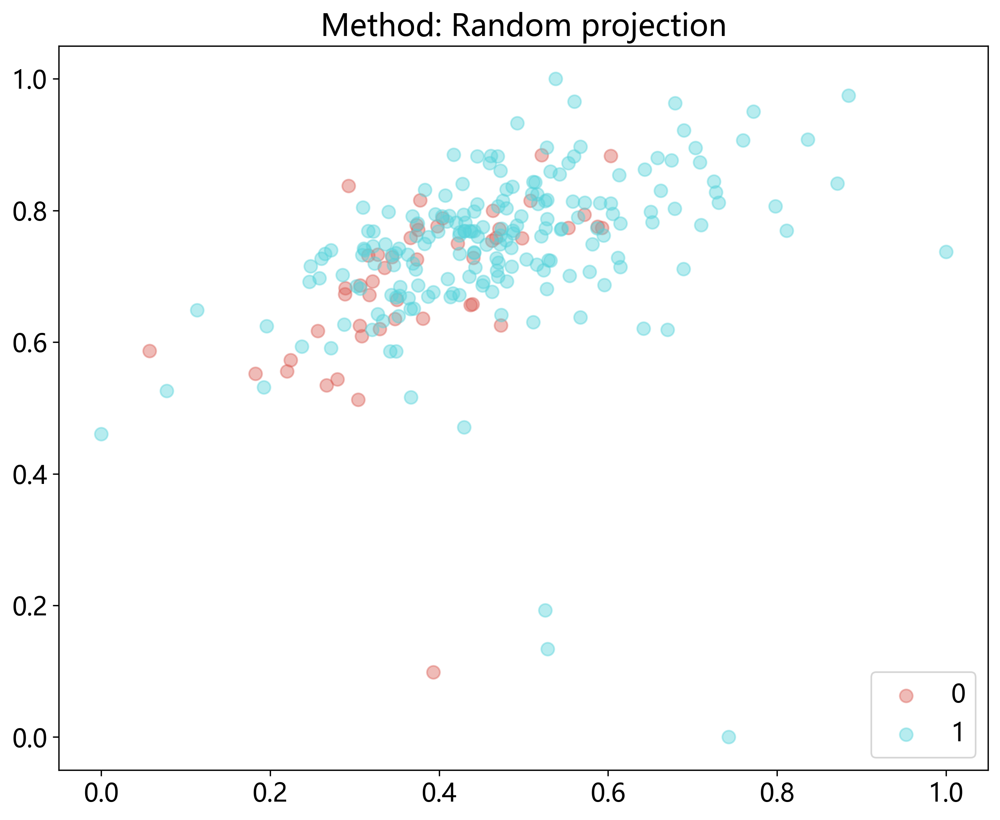

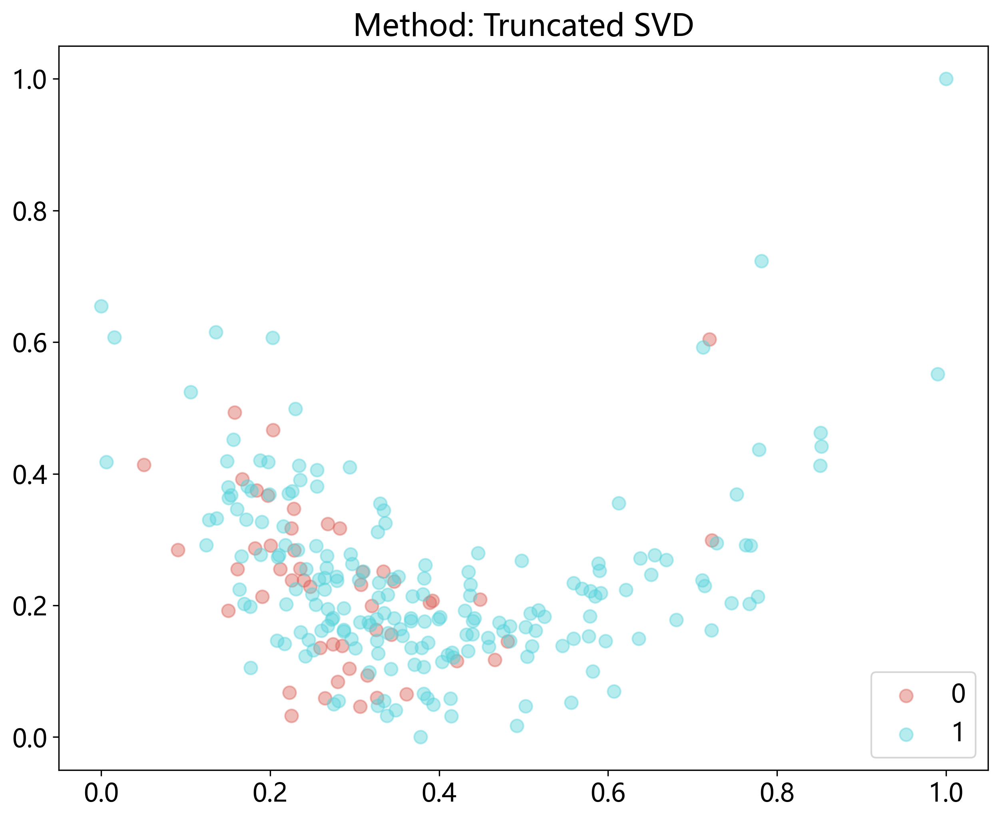

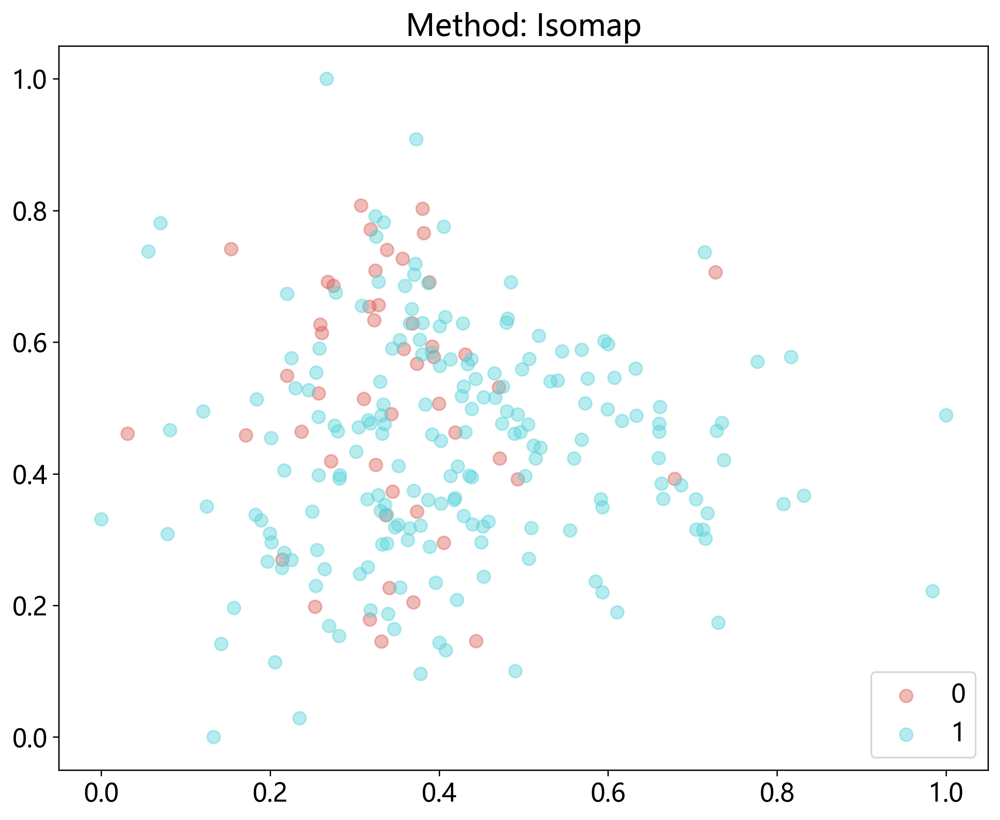

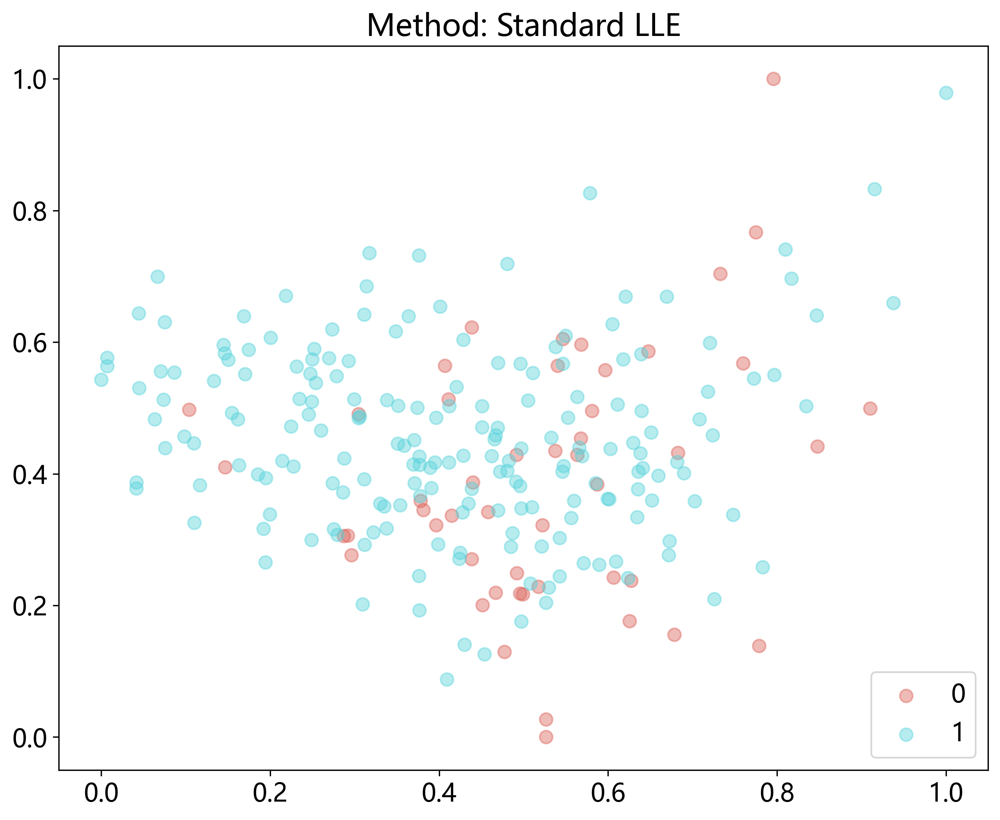

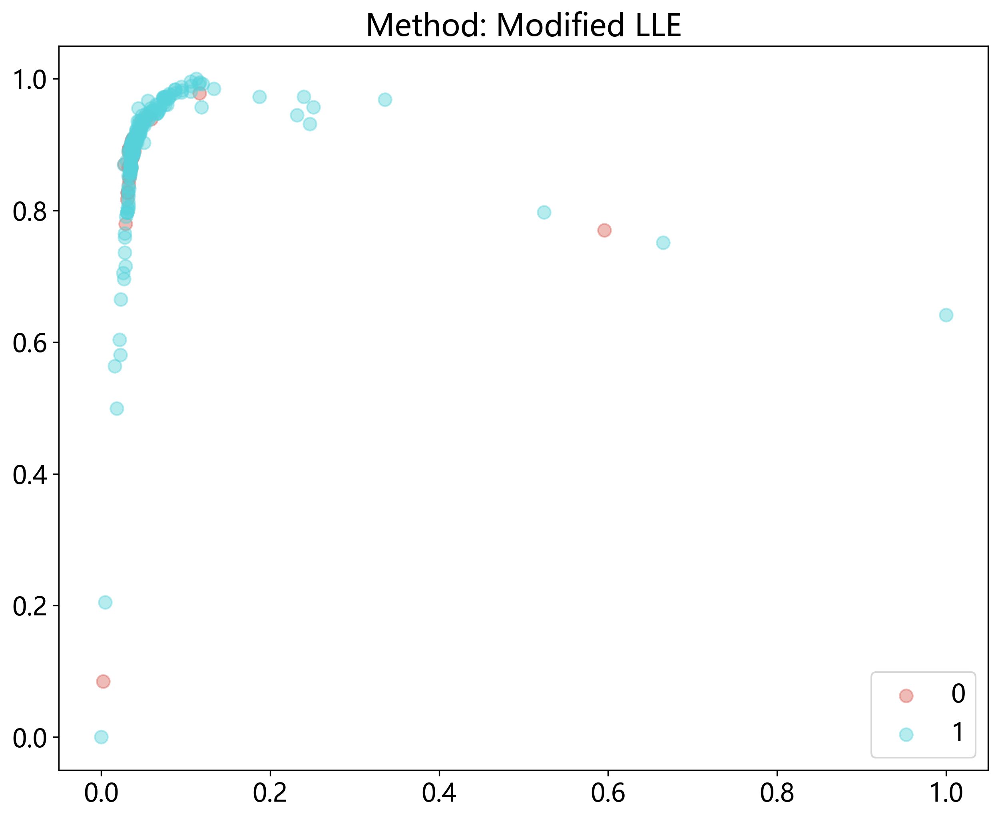

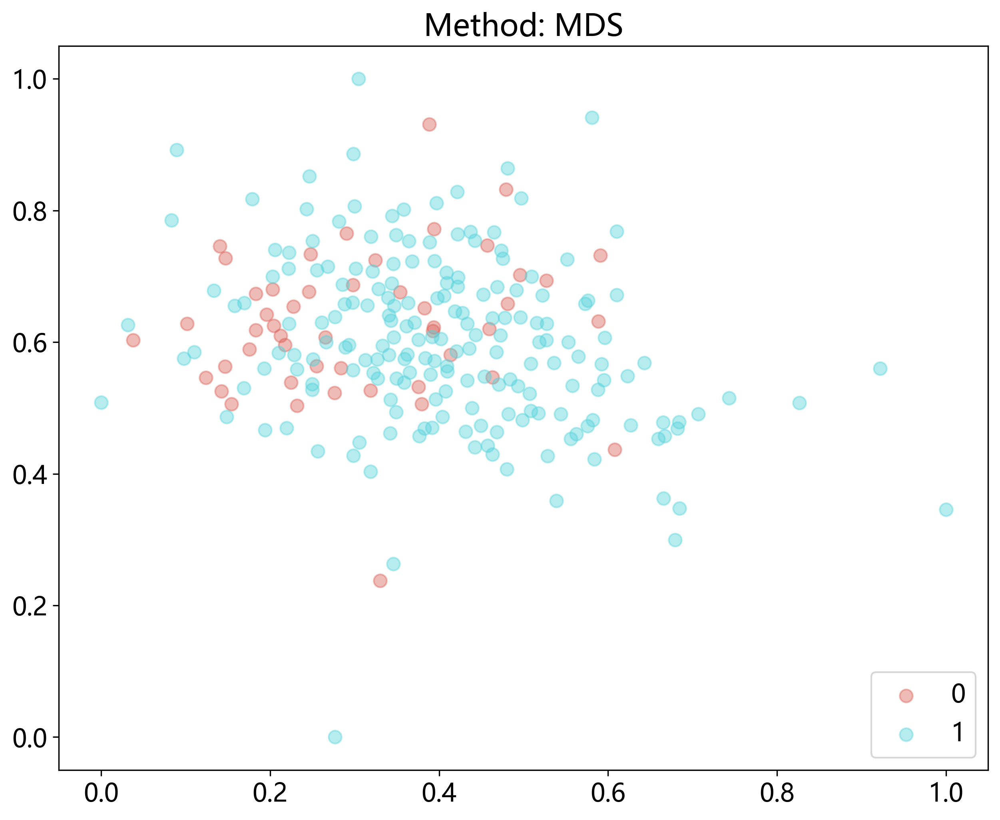

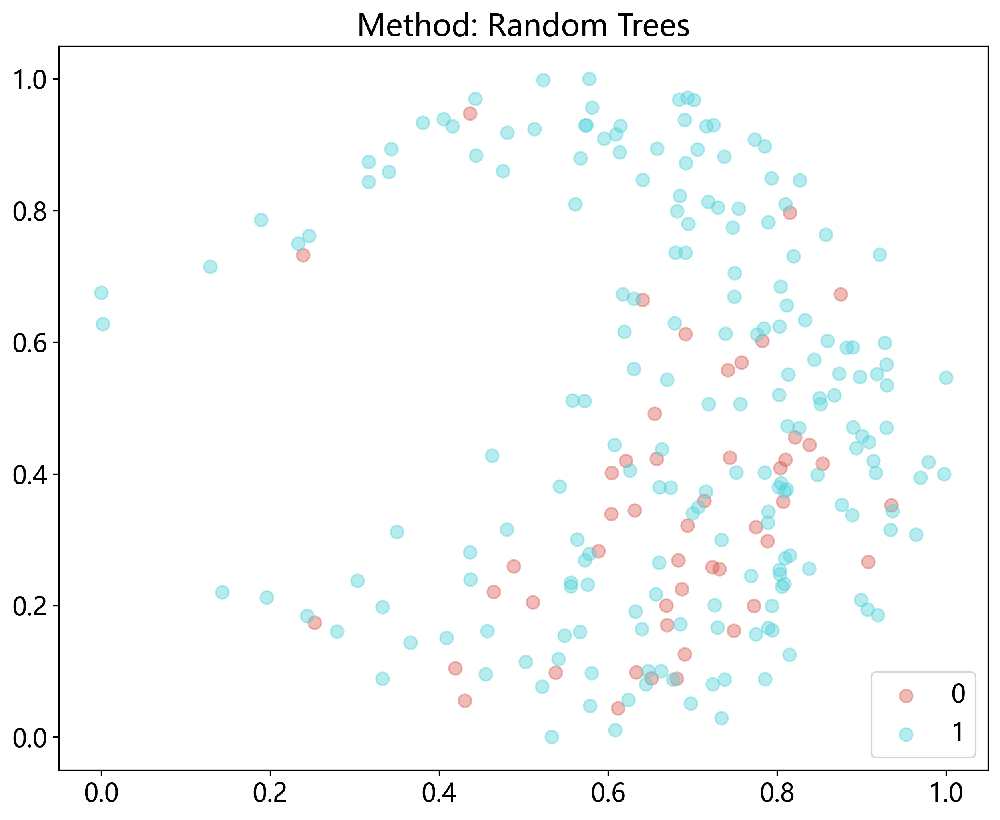

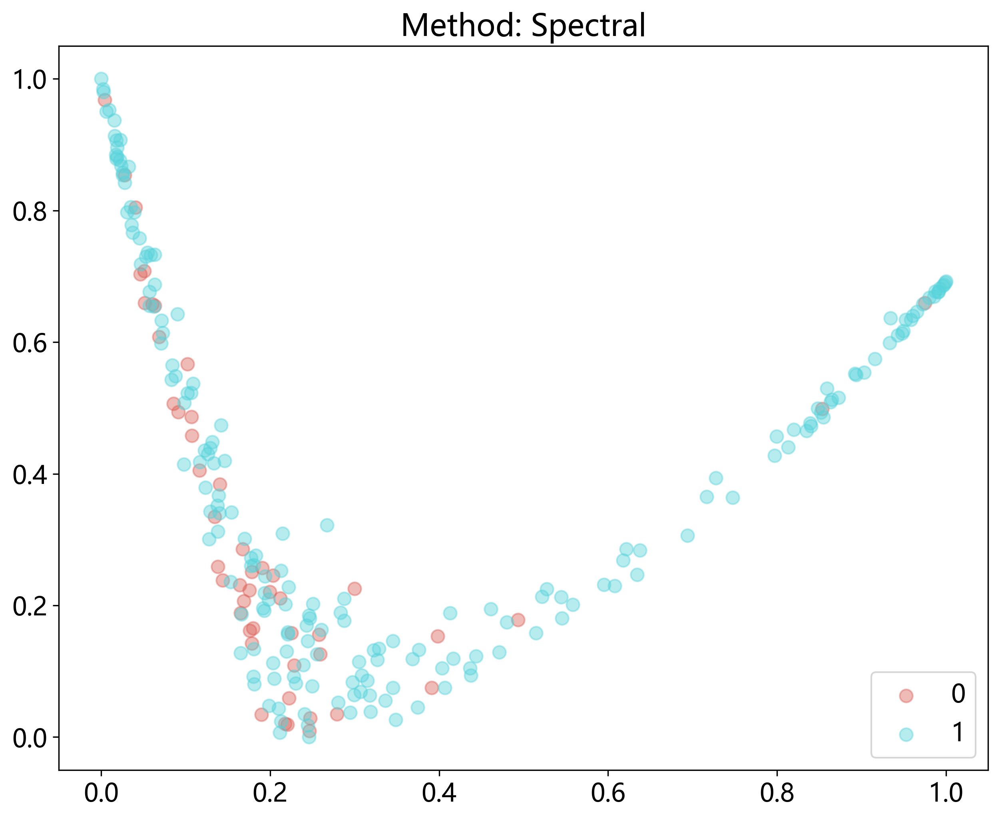

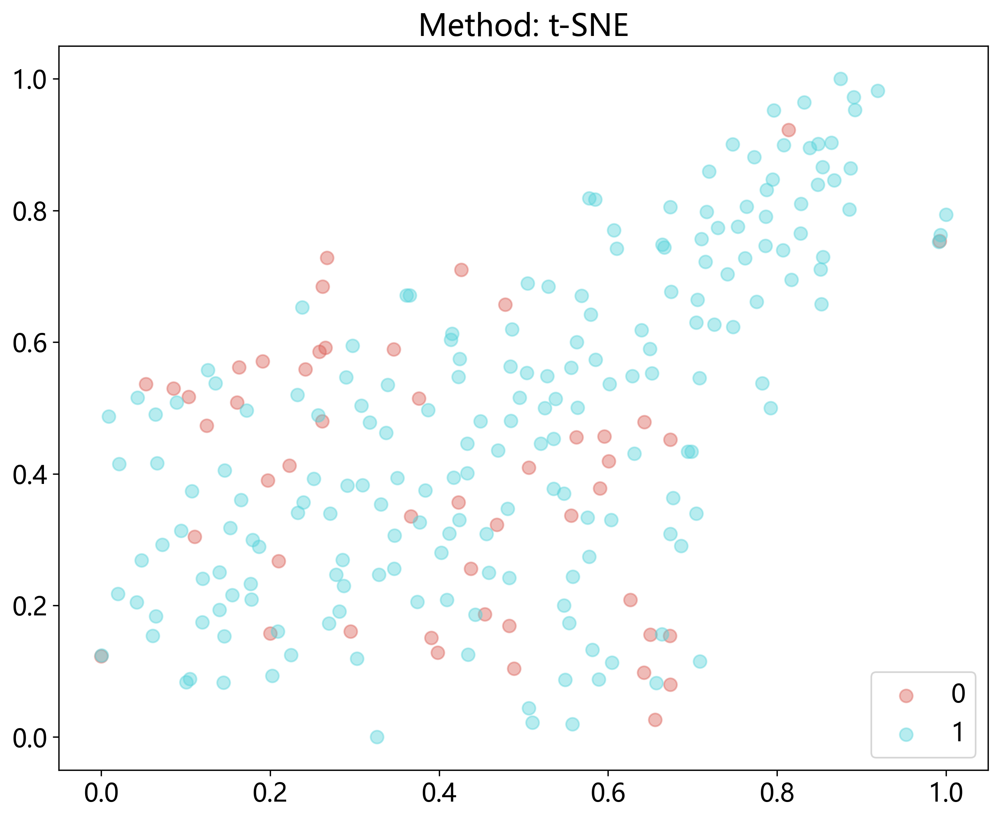

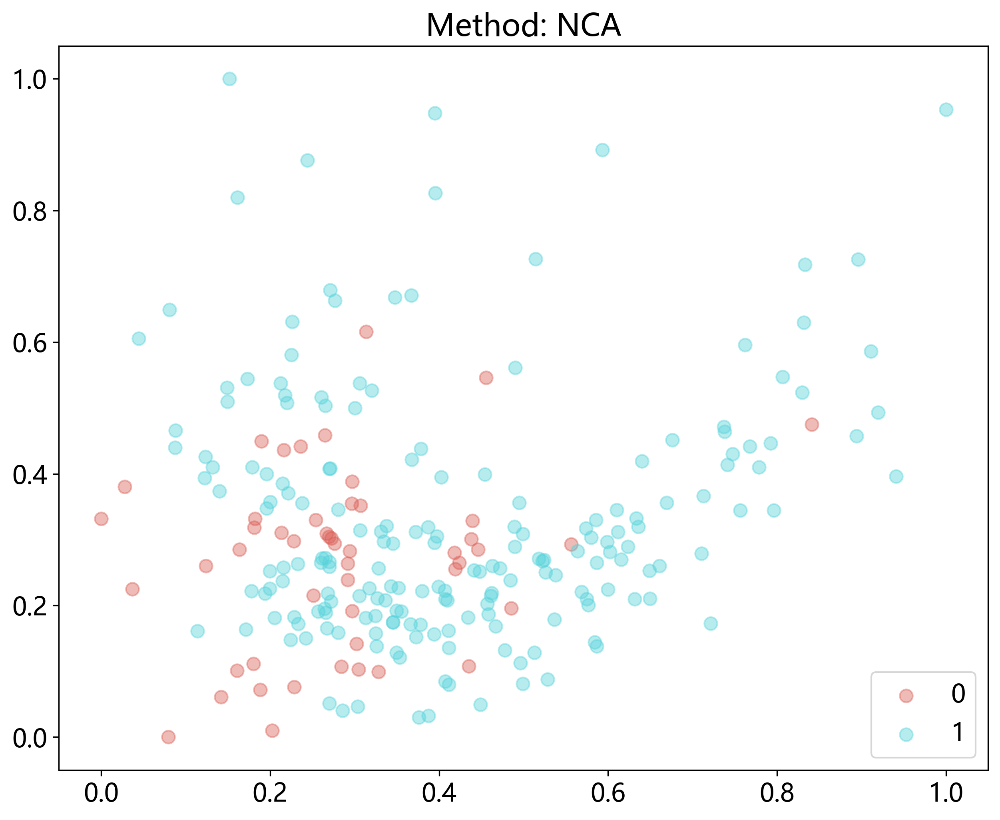

In [22]:
from onekey_algo.custom.components.comp1 import analysis_features
analysis_features(data[sel_feature[:-2]], data[labels[0]], methods=None)

## 构建数据

将样本的训练数据X与监督信息y分离出来，并且对训练数据进行划分，一般的划分原则为80%-20%

In [23]:
import numpy as np
import onekey_algo.custom.components as okcomp

n_classes = 2
train_data = sel_data[(sel_data[group_info] == 'train')]
train_ids = ids[train_data.index]
train_data = train_data.reset_index()
train_data = train_data.drop('index', axis=1)
y_data = train_data[labels]
X_data = train_data.drop(labels + [group_info], axis=1)

test_data = sel_data[sel_data[group_info] != 'train']
test_ids = ids[test_data.index]
test_data = test_data.reset_index()
test_data = test_data.drop('index', axis=1)
y_test_data = test_data[labels]
X_test_data = test_data.drop(labels + [group_info], axis=1)

y_all_data = sel_data[labels]
X_all_data = sel_data.drop(labels + [group_info], axis=1)

column_names = X_data.columns
print(f"训练集样本数：{X_data.shape}, 测试集样本数：{X_test_data.shape}")

训练集样本数：(193, 101), 测试集样本数：(49, 101)


### Lasso

初始化Lasso模型，alpha为惩罚系数。具体的参数文档可以参考：[文档](https://scikit-learn.org/stable/modules/generated/sklearn.linear_model.Lasso.html?highlight=lasso#sklearn.linear_model.Lasso)

### 交叉验证

不同Lambda下的，特征的的权重大小。
```python
def lasso_cv_coefs(X_data, y_data, points=50, column_names: List[str] = None, **kwargs):
    """

    Args:
        X_data: 训练数据
        y_data: 监督数据
        points: 打印多少个点。默认50
        column_names: 列名，默认为None，当选择的数据很多的时候，建议不要添加此参数
        **kwargs: 其他用于打印控制的参数。

    """
 ```

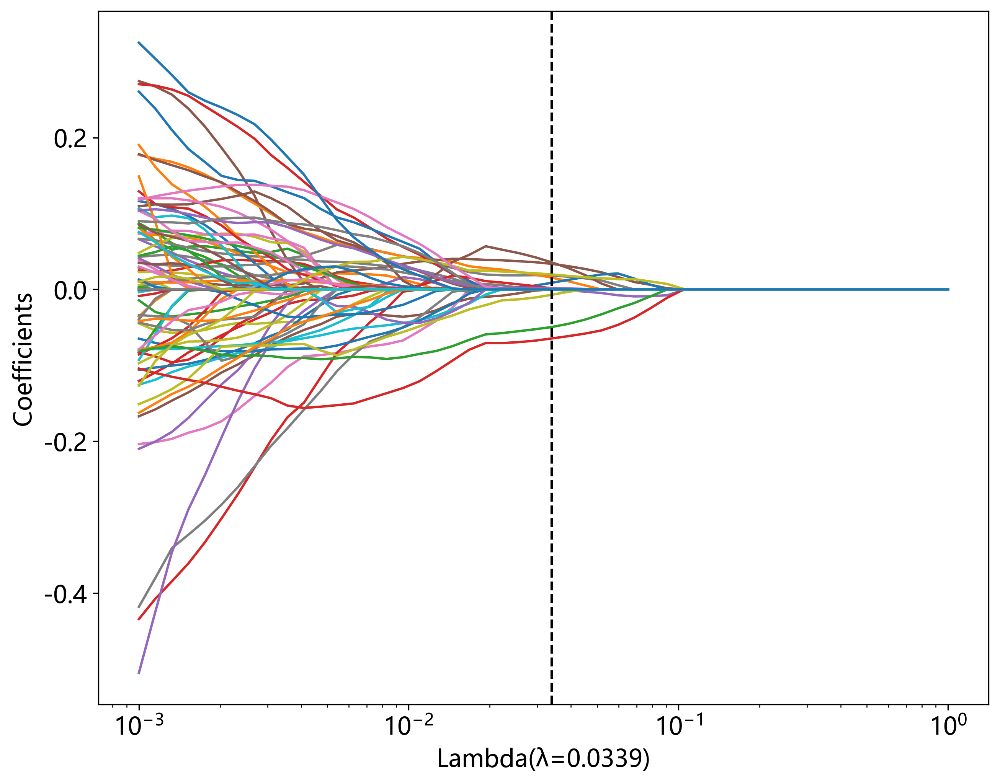

In [24]:
alpha = okcomp.comp1.lasso_cv_coefs(X_data, y_data, column_names=None, ensure_lastn=-27)
plt.savefig(f'img/Rad_feature_lasso.svg', bbox_inches = 'tight')

### 模型效能

```python
def lasso_cv_efficiency(X_data, y_data, points=50, **kwargs):
    """

    Args:
        Xdata: 训练数据
        ydata: 测试数据
        points: 打印的数据密度
        **kwargs: 其他的图像样式
            # 数据点标记, fmt="o"
            # 数据点大小, ms=3
            # 数据点颜色, mfc="r"
            # 数据点边缘颜色, mec="r"
            # 误差棒颜色, ecolor="b"
            # 误差棒线宽, elinewidth=2
            # 误差棒边界线长度, capsize=2
            # 误差棒边界厚度, capthick=1
    Returns:
    """
 ```

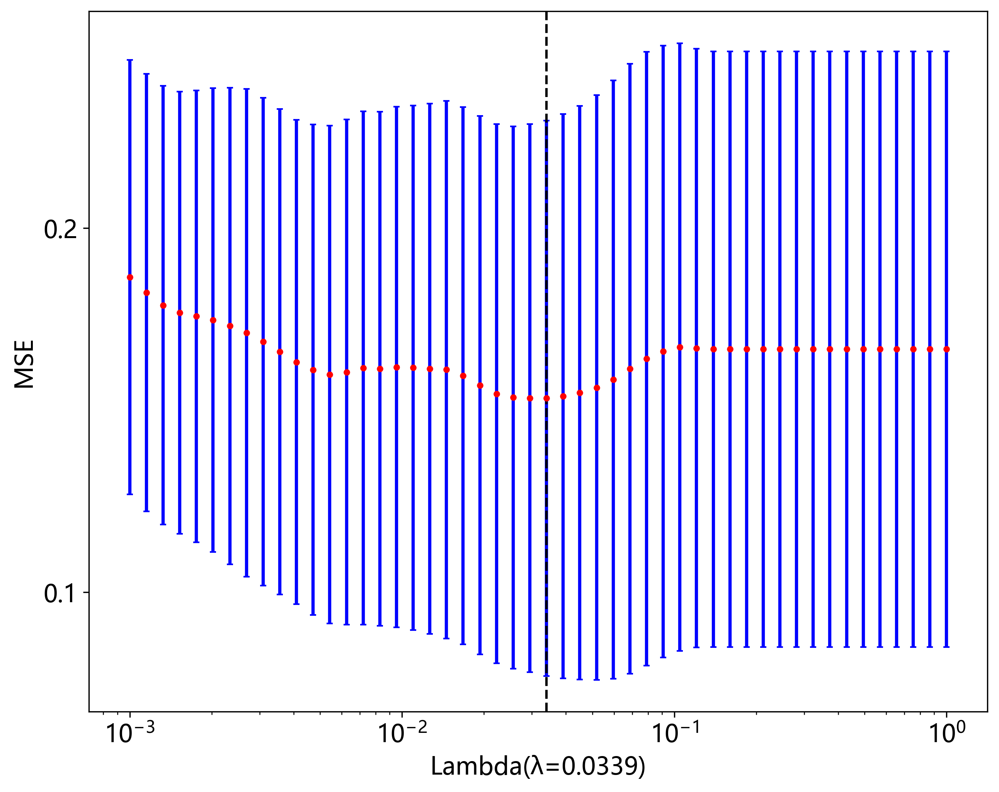

In [25]:
okcomp.comp1.lasso_cv_efficiency(X_data, y_data, points=50, ensure_lastn=-27)
plt.savefig(f'img/Rad_feature_mse.svg', bbox_inches = 'tight')

### 惩罚系数

使用交叉验证的惩罚系数作为模型训练的基础。

In [26]:
from sklearn import linear_model

models = []
for label in labels:
    clf = linear_model.Lasso(alpha=alpha)
    clf.fit(X_data, y_data[label])
    models.append(clf)

### 特征筛选

筛选出其中coef > 0的特征。并且打印出相应的公式。

In [27]:
COEF_THRESHOLD = 1e-6 # 筛选的特征阈值
scores = []
selected_features = []
for label, model in zip(labels, models):
    feat_coef = [(feat_name, coef) for feat_name, coef in zip(column_names, model.coef_) 
                 if COEF_THRESHOLD is None or abs(coef) > COEF_THRESHOLD]
    selected_features.append([feat for feat, _ in feat_coef])
    formula = ' '.join([f"{coef:+.6f} * {feat_name}" for feat_name, coef in feat_coef])
    score = f"{label} = {model.intercept_} {'+' if formula[0] != '-' else ''} {formula}"
    scores.append(score)
    
print(scores[0])

label = 0.7979274611398963 + +0.018277 * lbp_3D_m1_glszm_GrayLevelVariance +0.015500 * lbp_3D_m2_firstorder_InterquartileRange -0.000349 * lbp_3D_m2_glrlm_GrayLevelVariance +0.033693 * lbp_3D_m2_glszm_GrayLevelNonUniformityNormalized +0.035630 * wavelet_LHH_gldm_SmallDependenceHighGrayLevelEmphasis -0.007071 * wavelet_LHH_glrlm_LongRunHighGrayLevelEmphasis +0.008723 * wavelet_LHH_glrlm_ShortRunHighGrayLevelEmphasis -0.049561 * wavelet_LHL_firstorder_Median +0.001358 * wavelet_LHL_glcm_ClusterShade +0.019672 * wavelet_LLH_glcm_ClusterShade -0.064595 * wavelet_LLH_glszm_LargeAreaHighGrayLevelEmphasis +0.001750 * wavelet_LLH_glszm_SmallAreaHighGrayLevelEmphasis


### 特征权重

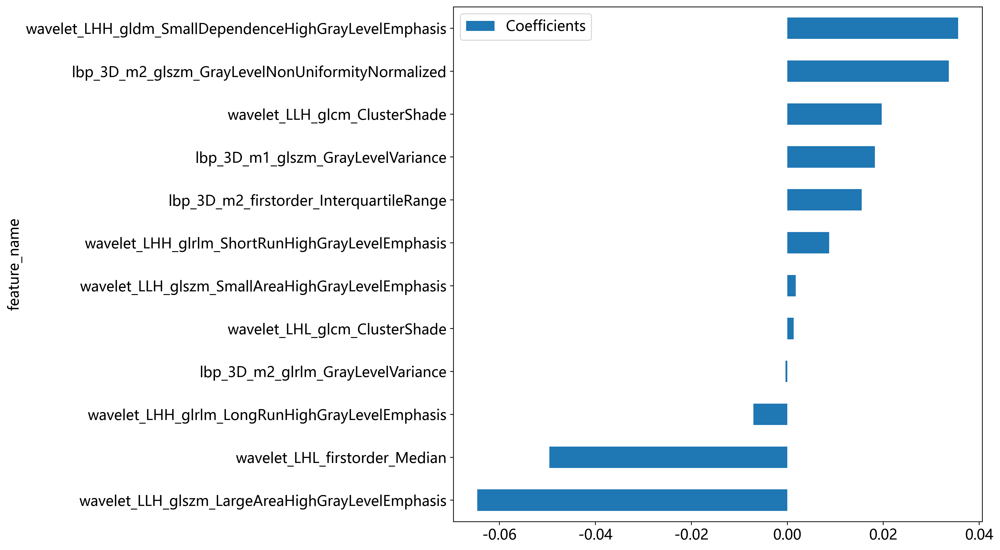

In [28]:
feat_coef = sorted(feat_coef, key=lambda x: x[1])
feat_coef_df = pd.DataFrame(feat_coef, columns=['feature_name', 'Coefficients'])
feat_coef_df.plot(x='feature_name', y='Coefficients', kind='barh', figsize=(10, 10))

plt.savefig(f'img/Rad_feature_weights.svg', bbox_inches = 'tight')

### 进一步筛选特征

使用Lasso筛选出来的Coefficients比较高的特征作为训练数据。

In [29]:
X_data = X_data[selected_features[0]]
X_test_data = X_test_data[selected_features[0]]
X_data.columns

Index(['lbp_3D_m1_glszm_GrayLevelVariance',
       'lbp_3D_m2_firstorder_InterquartileRange',
       'lbp_3D_m2_glrlm_GrayLevelVariance',
       'lbp_3D_m2_glszm_GrayLevelNonUniformityNormalized',
       'wavelet_LHH_gldm_SmallDependenceHighGrayLevelEmphasis',
       'wavelet_LHH_glrlm_LongRunHighGrayLevelEmphasis',
       'wavelet_LHH_glrlm_ShortRunHighGrayLevelEmphasis',
       'wavelet_LHL_firstorder_Median', 'wavelet_LHL_glcm_ClusterShade',
       'wavelet_LLH_glcm_ClusterShade',
       'wavelet_LLH_glszm_LargeAreaHighGrayLevelEmphasis',
       'wavelet_LLH_glszm_SmallAreaHighGrayLevelEmphasis'],
      dtype='object')

## 模型筛选

根据筛选出来的数据，做模型的初步选择。当前主要使用到的是Onekey中的

1. SVM，支持向量机，引用参考。
2. KNN，K紧邻，引用参考。
3. Decision Tree，决策树，引用参考。
4. Random Forests, 随机森林，引用参考。
5. XGBoost, bosting方法。引用参考。
6. LightGBM, bosting方法，引用参考。

In [30]:
import joblib
from onekey_algo.custom.components.comp1 import plot_feature_importance
from sklearn.ensemble import ExtraTreesClassifier, RandomForestClassifier
from sklearn.neural_network import MLPClassifier
from xgboost import XGBClassifier
from lightgbm import LGBMClassifier
from sklearn.linear_model import LogisticRegression

model_names = get_param_in_cwd('ml_models')
models = okcomp.comp1.create_clf_model(model_names)
models['LR'] = LogisticRegression(penalty='none', max_iter=100)
models['RandomForest'] = RandomForestClassifier(n_estimators=40, max_depth=4, min_samples_split=2, random_state=0)
models['XGBoost'] = XGBClassifier(n_estimators=15, objective='binary:logistic', max_depth=2, min_child_weight=1.2,
                                  use_label_encoder=False, eval_metric='error')
models['LightGBM'] = LGBMClassifier(n_estimators=24,  max_depth=2, min_child_weight=0.5,)
models['ExtraTrees'] = ExtraTreesClassifier(n_estimators=46, max_depth=4, min_samples_split=2, random_state=0)
    
model_names = list(models.keys())

### 交叉验证

`n_trails`指定随机次数，每次采用的是80%训练，随机20%进行测试，找到最好的模型，以及对应的最好的数据划分。


```python
def get_bst_split(X_data: pd.DataFrame, y_data: pd.DataFrame,
            models: dict, test_size=0.2, metric_fn=accuracy_score, n_trails=10,
            cv: bool = False, shuffle: bool = False, metric_cut_off: float = None, random_state=None):
    """
    寻找数据集中最好的数据划分。
    Args:
        X_data: 训练数据
        y_data: 监督数据
        models: 模型名称，Dict类型、
        test_size: 测试集比例，只有当cv=False时生效
        metric_fn: 评价模型好坏的函数，默认准确率，可选roc_auc_score。
        n_trails: 尝试多少次寻找最佳数据集划分。
        cv: 是否是交叉验证，默认是False，当为True时，n_trails为交叉验证的n_fold
        shuffle: 是否进行随机打乱
        metric_cut_off: 当metric_fn的值达到多少时进行截断。
        random_state: 随机种子

    Returns: {'max_idx': max_idx, "max_model": max_model, "max_metric": max_metric, "results": results}

    """
```

**注意：这里采用了【挑数据】，如果想要严谨，请修改`n_trails=1`。**

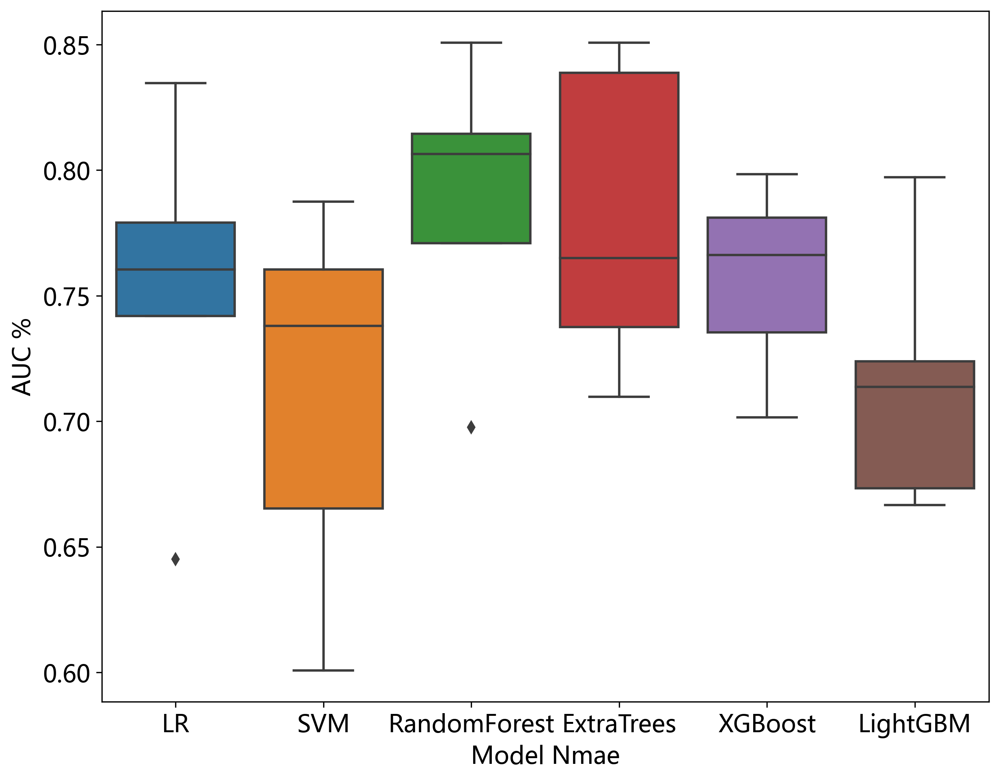

In [31]:
import seaborn as sns
import matplotlib.pyplot as plt
import pandas as pd
from sklearn.metrics import accuracy_score, roc_auc_score

# 随机使用n_trails次数据划分，找到最好的一次划分方法，并且保存在results中。
results = okcomp.comp1.get_bst_split(X_data, y_data, models, test_size=0.2, metric_fn=roc_auc_score, n_trails=5, cv=True, random_state=0)
_, (X_train_sel, X_test_sel, y_train_sel, y_test_sel) = results['results'][results['max_idx']]
X_train_sel, X_test_sel, y_train_sel, y_test_sel = X_data, X_test_data, y_data, y_test_data
trails, _ = zip(*results['results'])
cv_results = pd.DataFrame(trails, columns=model_names)
# 可视化每个模型在不同的数据划分中的效果。
sns.boxplot(data=cv_results)
plt.ylabel('AUC %')
plt.xlabel('Model Nmae')
plt.savefig(f'img/Rad_model_cv.svg', bbox_inches = 'tight')

## 模型筛选

使用最好的数据划分，进行后续的模型研究。

**注意**: 一般情况下论文使用的是随机划分的数据，但也有些论文使用【刻意】筛选的数据划分。

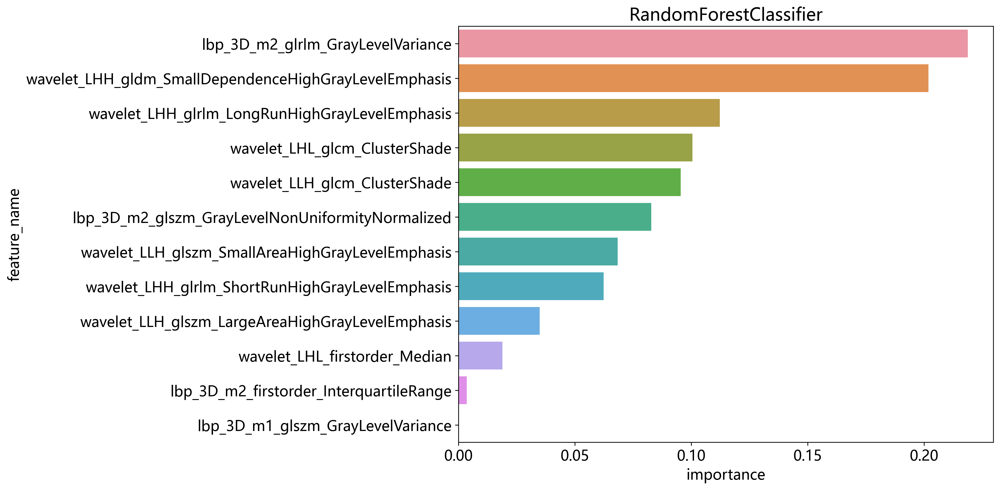

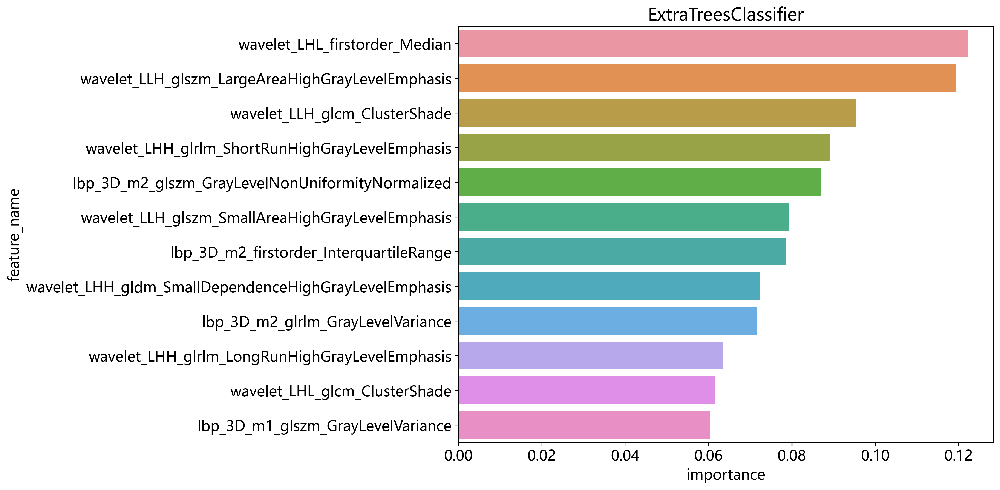

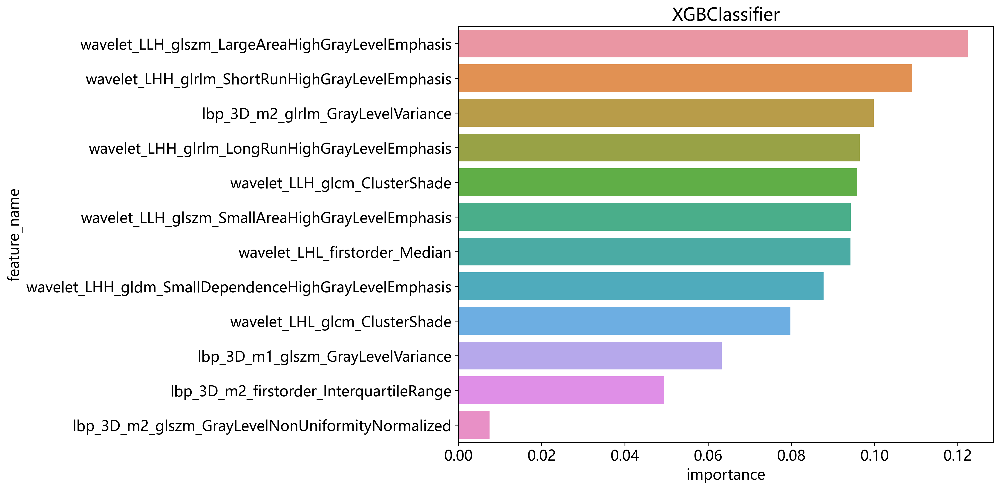

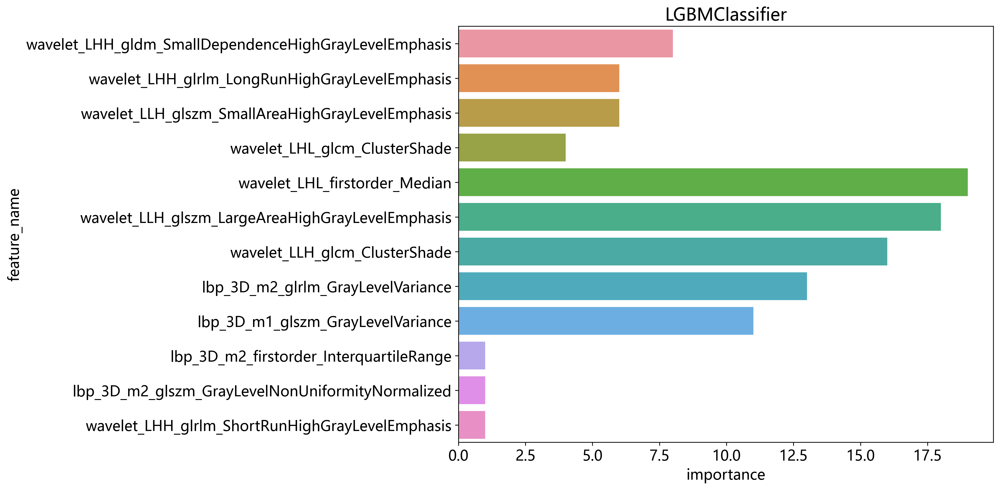

In [32]:
import joblib
from onekey_algo.custom.components.comp1 import plot_feature_importance
from sklearn.ensemble import ExtraTreesClassifier, RandomForestClassifier
from sklearn.neural_network import MLPClassifier
from xgboost import XGBClassifier
from lightgbm import LGBMClassifier
from sklearn.linear_model import LogisticRegression

targets = []
os.makedirs('models', exist_ok=True)
for l in labels:
    new_models = okcomp.comp1.create_clf_model(model_names)
    new_models['LR'] = LogisticRegression(penalty='none', max_iter=100)
    new_models['RandomForest'] = RandomForestClassifier(n_estimators=5, max_depth=3,
                                                        min_samples_split=2, random_state=0)
    new_models['XGBoost'] = XGBClassifier(n_estimators=17, objective='binary:logistic', max_depth=2, min_child_weight=1.2,
                                              use_label_encoder=False, eval_metric='error')
    new_models['LightGBM'] = LGBMClassifier(n_estimators=25,  max_depth=3, min_child_weight=0.5,)
    new_models['ExtraTrees'] = ExtraTreesClassifier(n_estimators=500, max_depth=4, min_samples_split=2, random_state=0)
#     new_models['MLP'] = MLPClassifier()
    new_models = list(new_models.values())
    for mn, m in zip(model_names, new_models):
        m.fit(X_train_sel, y_train_sel[l])
        # 保存训练的模型
        joblib.dump(m, f'models/{task_type}Rad_{mn}_{l}.pkl') 
        # 输出模型特征重要性，只针对高级树模型有用
        plot_feature_importance(m, selected_features[0], save_dir='img', prefix=f'{task_type}')
    targets.append(new_models)

## 预测结果

* predictions，二维数据，每个label对应的每个模型的预测结果。
* pred_scores，二维数据，每个label对应的每个模型的预测概率值。

In [33]:
from sklearn.metrics import accuracy_score
from sklearn.preprocessing import OneHotEncoder
from onekey_algo.custom.components.delong import calc_95_CI
from onekey_algo.custom.components.metrics import analysis_pred_binary

metric = []
pred_sel_idx = []
predictions = [[(model.predict(X_train_sel), model.predict(X_test_sel))  
                for model in target] for label, target in zip(labels, targets)]
pred_scores = [[(model.predict_proba(X_train_sel), model.predict_proba(X_test_sel)) 
                for model in target] for label, target in zip(labels, targets)]
for label, prediction, scores in zip(labels, predictions, pred_scores):
    pred_sel_idx_label = []
    for mname, (train_pred, test_pred), (train_score, test_score) in zip(model_names, prediction, scores):
        # 计算训练集指数
        acc, auc, ci, tpr, tnr, ppv, npv, precision, recall, f1, thres = analysis_pred_binary(y_train_sel[label], 
                                                                                              train_score[:, 1])
        ci = f"{ci[0]:.4f} - {ci[1]:.4f}"
        metric.append((mname, acc, auc, ci, tpr, tnr, ppv, npv, precision, recall, f1, thres, f"Train"))

        # 计算验证集指标
        acc, auc, ci, tpr, tnr, ppv, npv, precision, recall, f1, thres = analysis_pred_binary(y_test_sel[label], 
                                                                                              test_score[:, 1])
        ci = f"{ci[0]:.4f} - {ci[1]:.4f}"
        metric.append((mname, acc, auc, ci, tpr, tnr, ppv, npv, precision, recall, f1, thres, 'Test'))
        # 计算thres对应的sel idx
        pred_sel_idx_label.append(np.logical_or(test_score[:, 0] >= thres, test_score[:, 1] >= thres))

    pred_sel_idx.append(pred_sel_idx_label)
metric = pd.DataFrame(metric, index=None, columns=['model_name', 'Accuracy', 'AUC', '95% CI',
                                                   'Sensitivity', 'Specificity', 
                                                   'PPV', 'NPV', 'Precision', 'Recall', 'F1',
                                                   'Threshold', 'Task'])
metric

,model_name,Accuracy,AUC,95% CI,Sensitivity,Specificity,PPV,NPV,Precision,Recall,F1,Threshold,Task
0,LR,0.798,0.853,0.7857 - 0.9209,0.795,0.799,0.500,0.939,0.500,0.795,0.614,0.248,Train
1,LR,0.735,0.721,0.5278 - 0.9132,0.700,0.744,0.412,0.906,0.412,0.700,0.519,0.256,Test
2,SVM,0.860,0.900,0.8390 - 0.9611,0.872,0.857,0.607,0.964,0.607,0.872,0.716,0.163,Train
3,SVM,0.816,0.774,0.5905 - 0.9582,0.800,0.821,0.533,0.941,0.533,0.800,0.640,0.226,Test
4,RandomForest,0.819,0.909,0.8624 - 0.9549,0.897,0.799,0.530,0.969,0.530,0.897,0.667,0.216,Train
5,RandomForest,0.816,0.729,0.5313 - 0.9277,0.800,0.842,0.533,0.941,0.533,0.800,0.640,0.242,Test
6,ExtraTrees,0.902,0.950,0.9177 - 0.9818,0.872,0.909,0.708,0.966,0.708,0.872,0.782,0.259,Train
7,ExtraTrees,0.816,0.733,0.5422 - 0.9245,0.700,0.846,0.538,0.917,0.538,0.700,0.609,0.289,Test
8,XGBoost,0.881,0.975,0.9569 - 0.9928,1.000,0.851,0.629,1.000,0.629,1.000,0.772,0.198,Train
9,XGBoost,0.755,0.736,0.5320 - 0.9398,0.700,0.769,0.437,0.909,0.437,0.700,0.538,0.234,Test


### 绘制曲线

绘制的不同模型的准确率柱状图和折线图曲线。

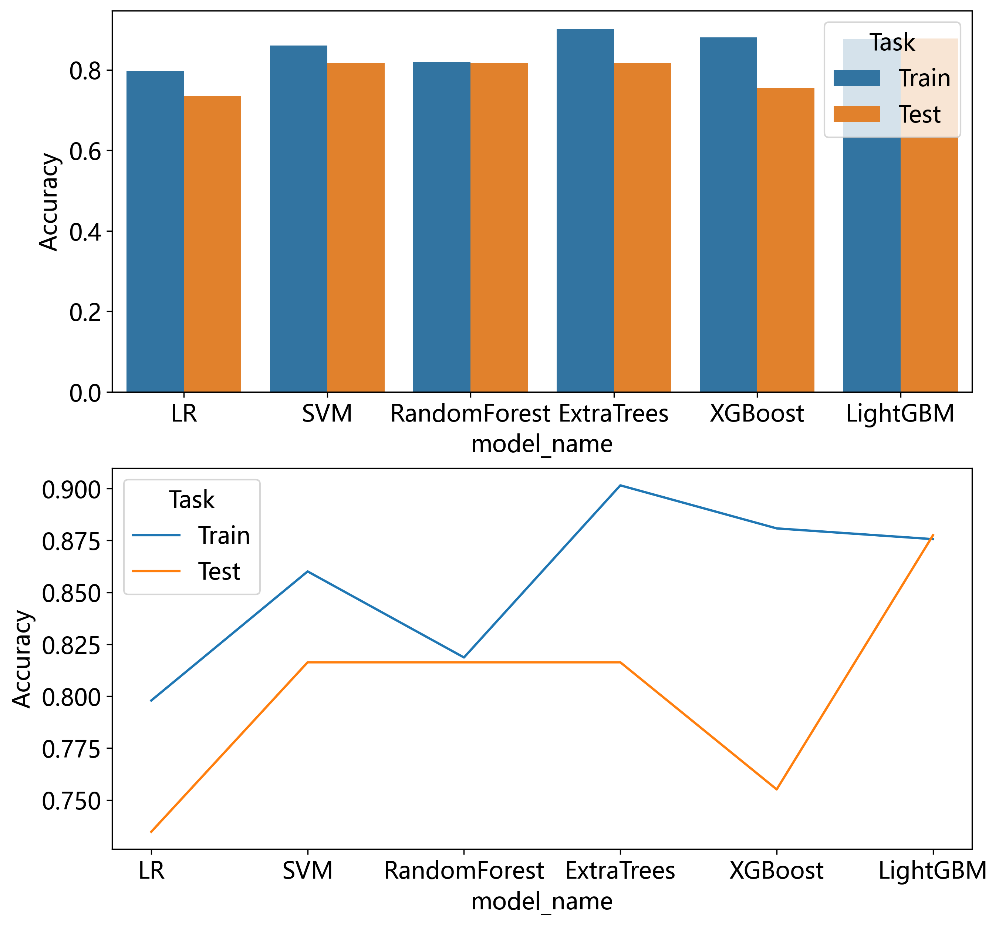

In [34]:
import seaborn as sns

plt.figure(figsize=(10, 10))
plt.subplot(211)
sns.barplot(x='model_name', y='Accuracy', data=metric, hue='Task')
plt.subplot(212)
sns.lineplot(x='model_name', y='Accuracy', data=metric, hue='Task')
plt.savefig(f'img/Rad_model_acc.svg', bbox_inches = 'tight')

### 绘制ROC曲线
确定最好的模型，并且绘制曲线。

```python
def draw_roc(y_test, y_score, title='ROC', labels=None):
```

`sel_model = ['SVM', 'KNN']`参数为想要绘制的模型对应的参数。

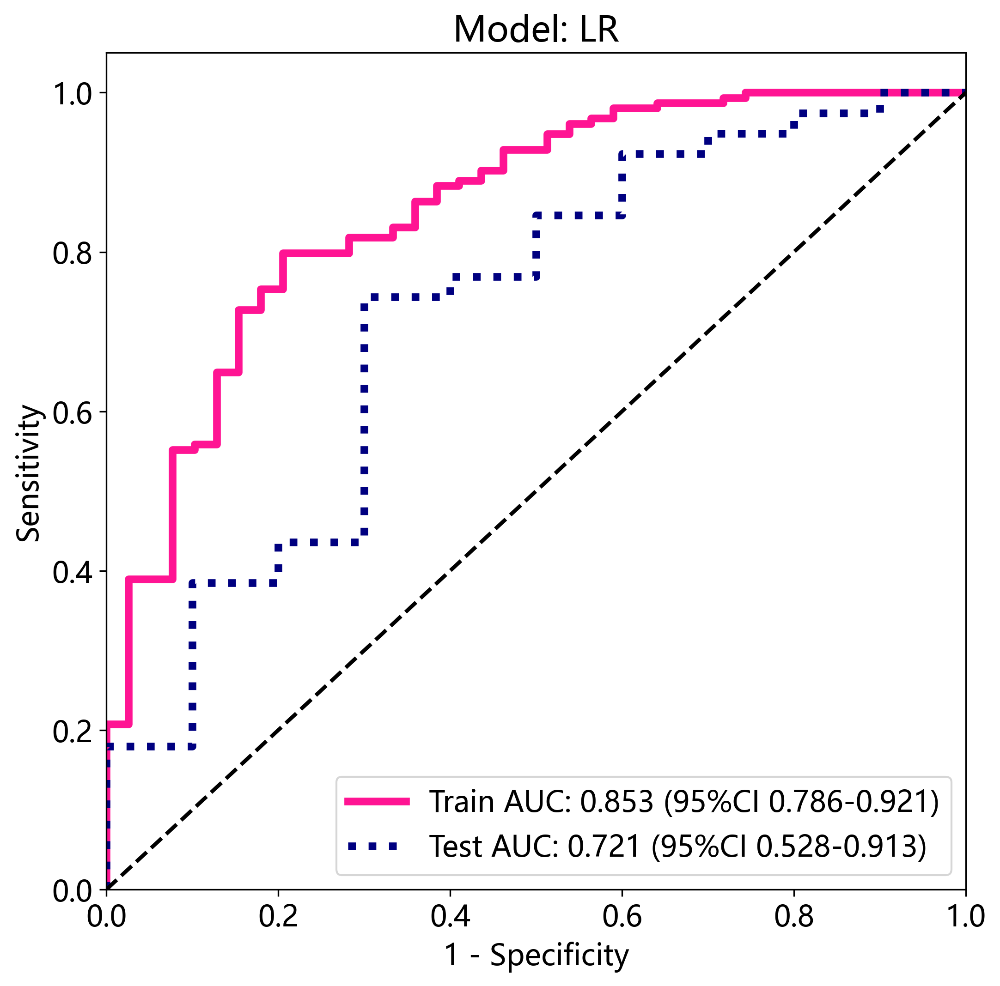

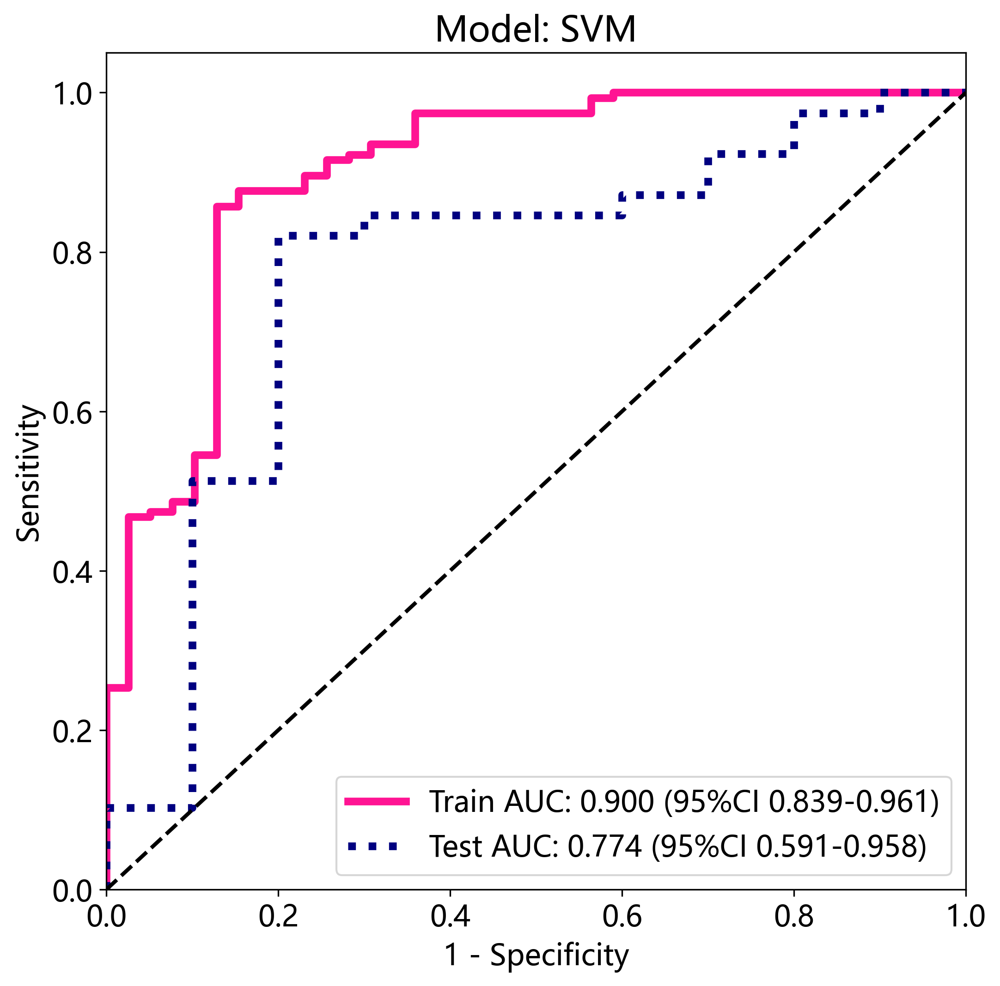

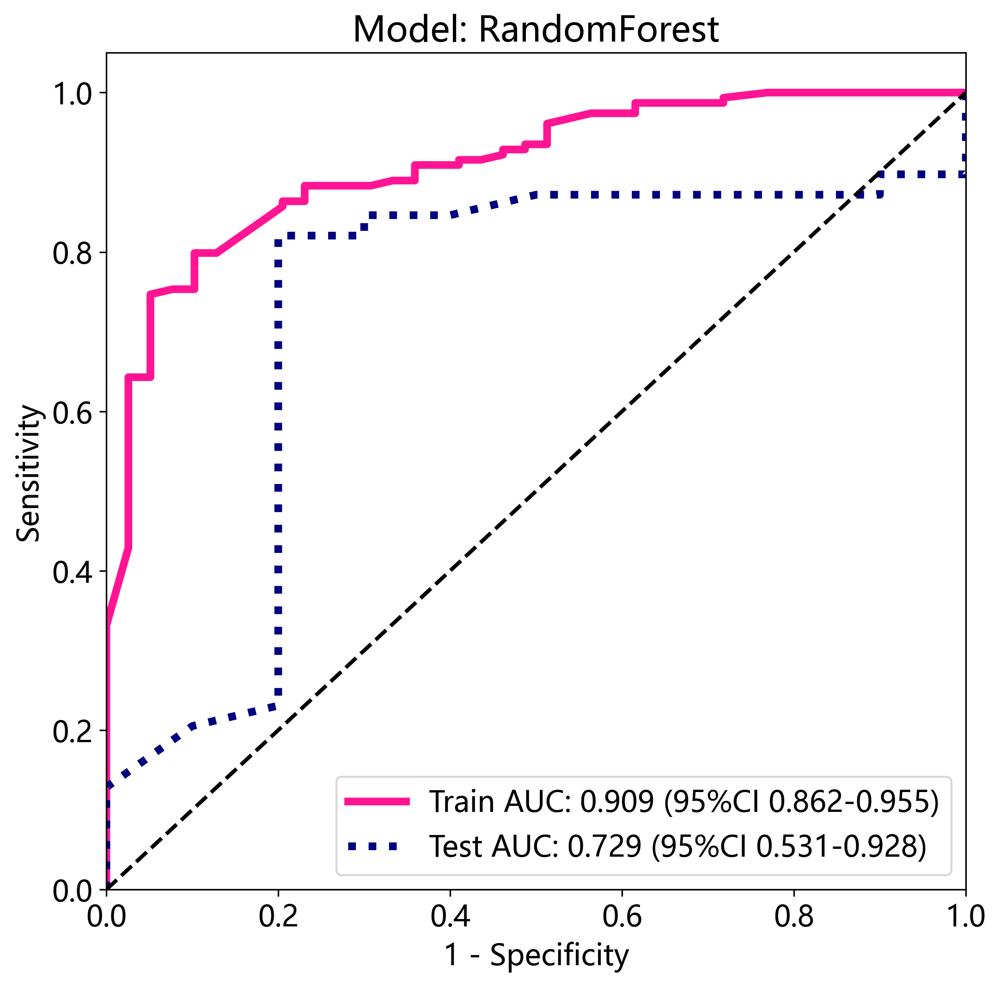

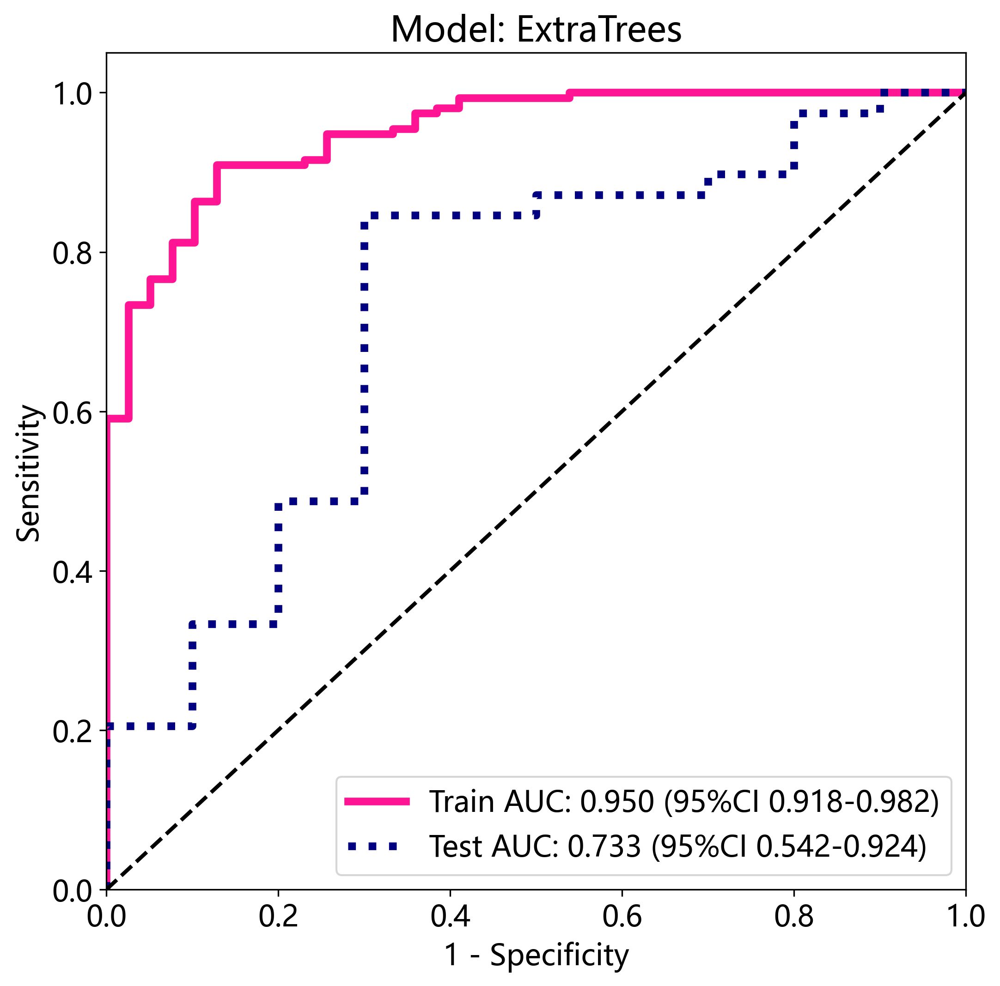

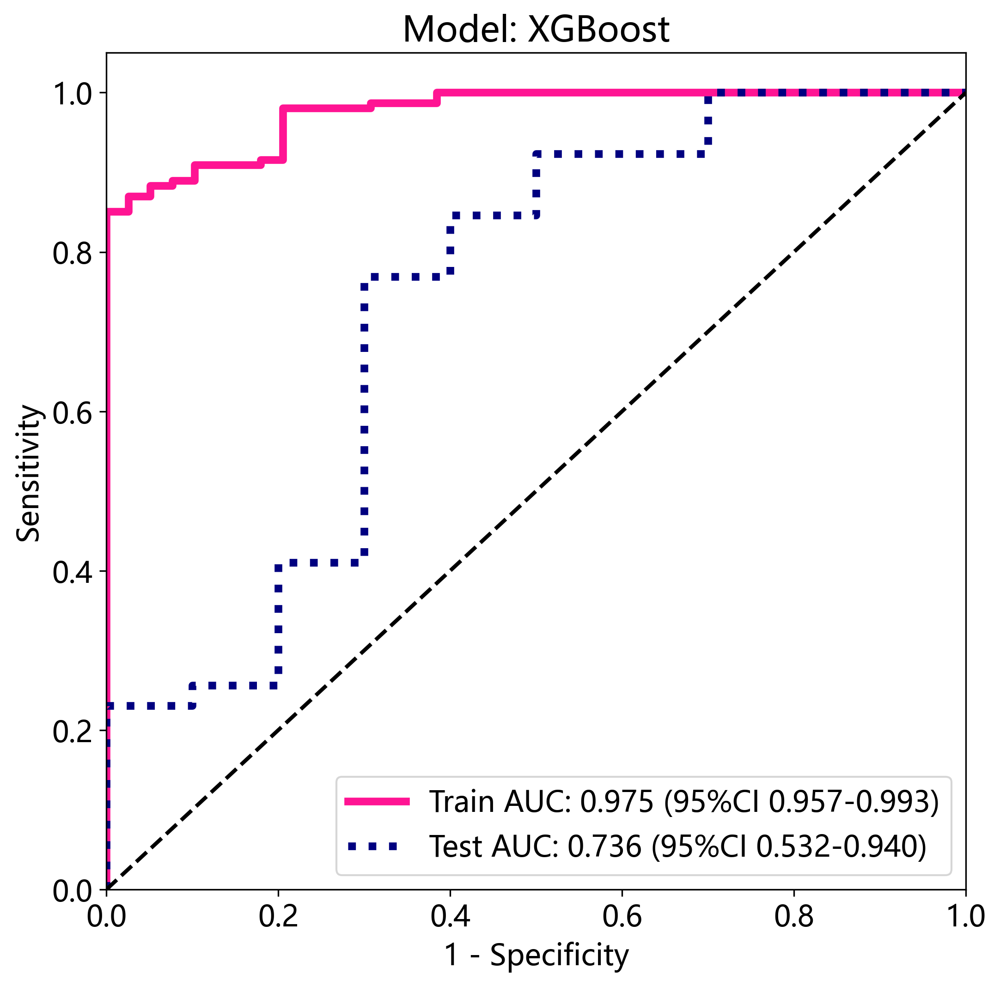

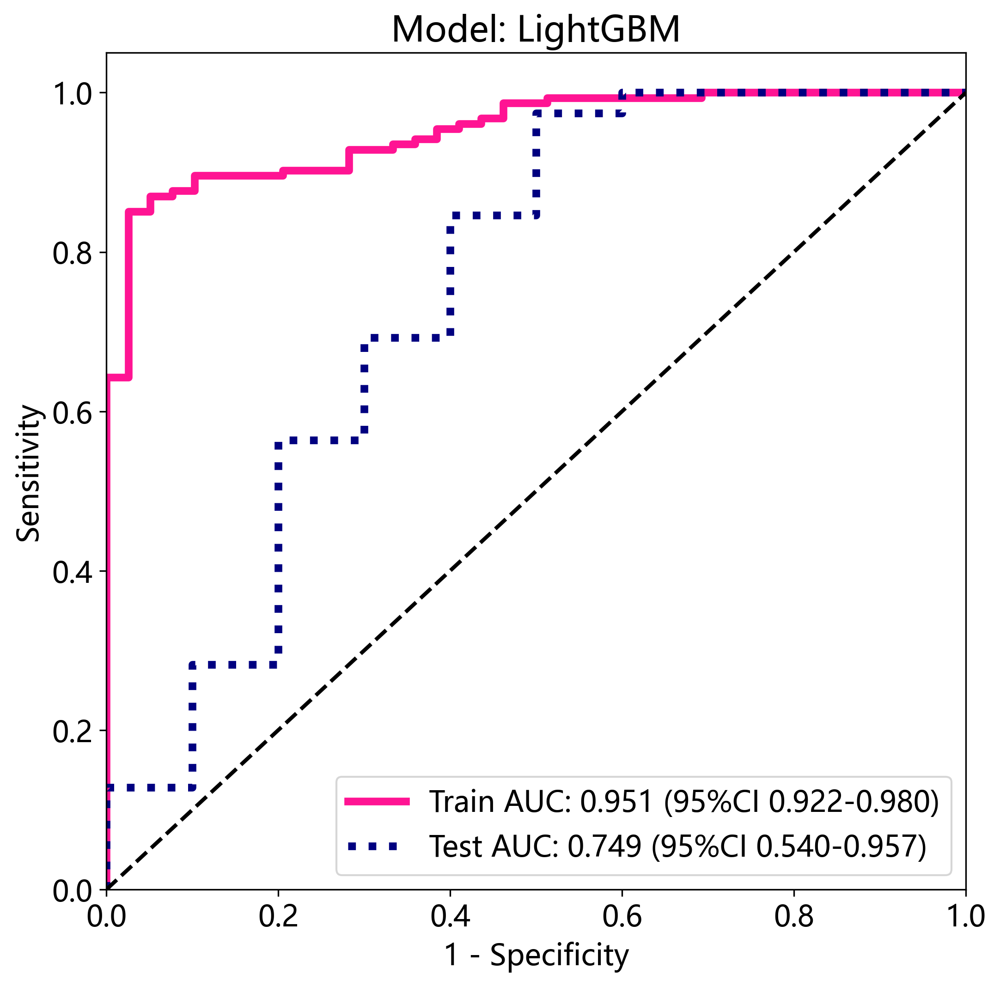

In [35]:
sel_model = model_names

for sm in sel_model:
    if sm in model_names:
        sel_model_idx = model_names.index(sm)
    
        # Plot all ROC curves
        plt.figure(figsize=(8, 8))
        for pred_score, label in zip(pred_scores, labels):
            okcomp.comp1.draw_roc([np.array(y_train_sel[label]), np.array(y_test_sel[label])], 
                                  pred_score[sel_model_idx], 
                                  labels=['Train', 'Test'], title=f"Model: {sm}")
            plt.savefig(f'img/Rad_model_{sm}_roc.svg', bbox_inches = 'tight')

#### 汇总所有模型

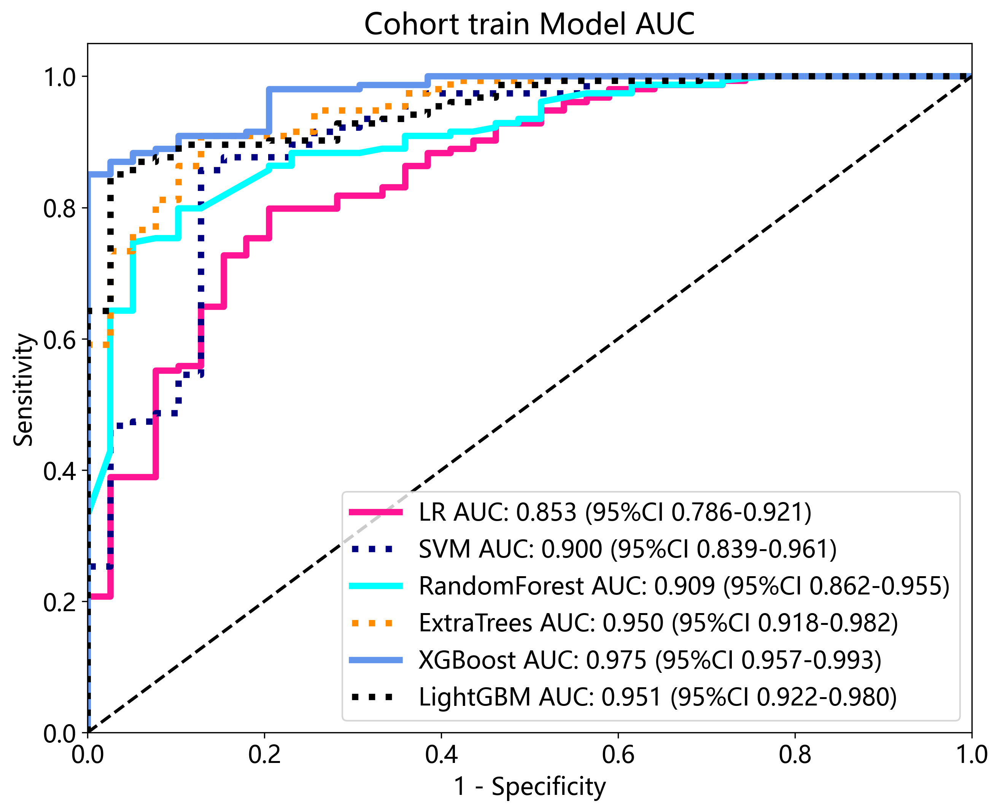

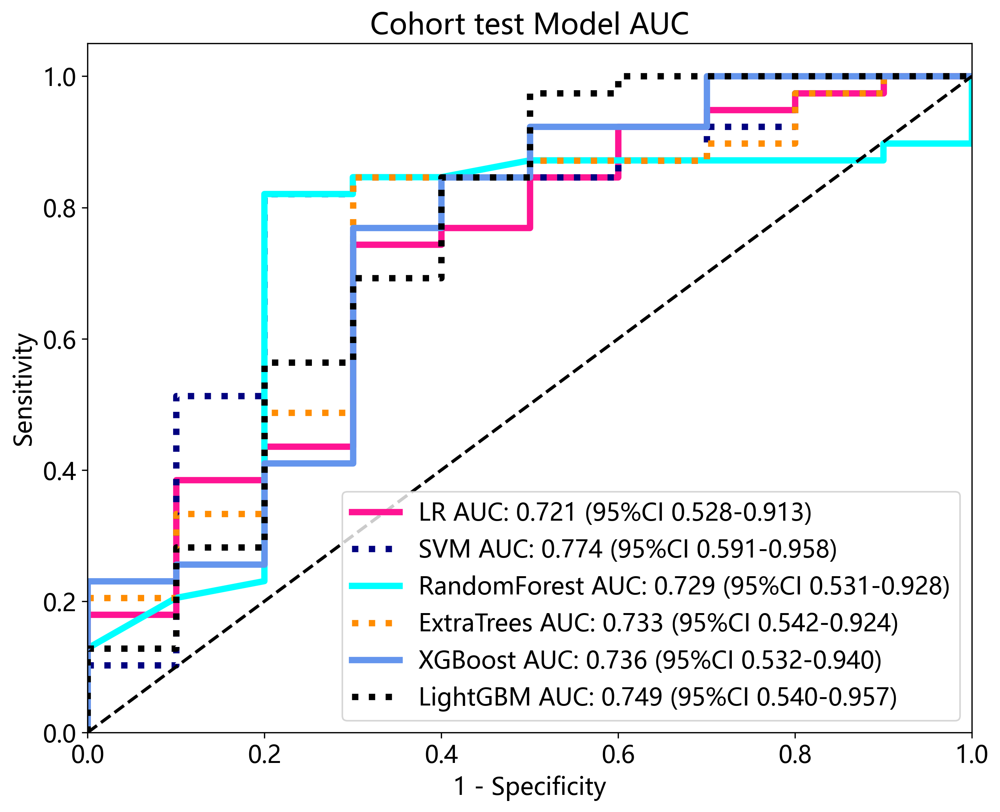

In [41]:
sel_model = model_names

for pred_score, label in zip(pred_scores, labels):
    pred_val_scores = []
    pred_test_scores = []
    
    for sm in sel_model:
        if sm in model_names:
            sel_model_idx = model_names.index(sm)
            pred_val_scores.append(pred_score[sel_model_idx][0])
            pred_test_scores.append(pred_score[sel_model_idx][1])
    okcomp.comp1.draw_roc([np.array(y_train_sel[label])] * len(pred_val_scores), 
                          pred_val_scores, 
                          labels=sel_model, title=f"Cohort train Model AUC")
    plt.savefig(f'img/{task_type}Rad_model_train_roc.svg', bbox_inches = 'tight')
    plt.show()
    okcomp.comp1.draw_roc([np.array(y_test_sel[label])] * len(pred_test_scores), 
                          pred_test_scores, 
                          labels=sel_model, title=f"Cohort test Model AUC")
    plt.savefig(f'img/{task_type}Rad_model_test_roc.svg', bbox_inches = 'tight')

### DCA 决策曲线

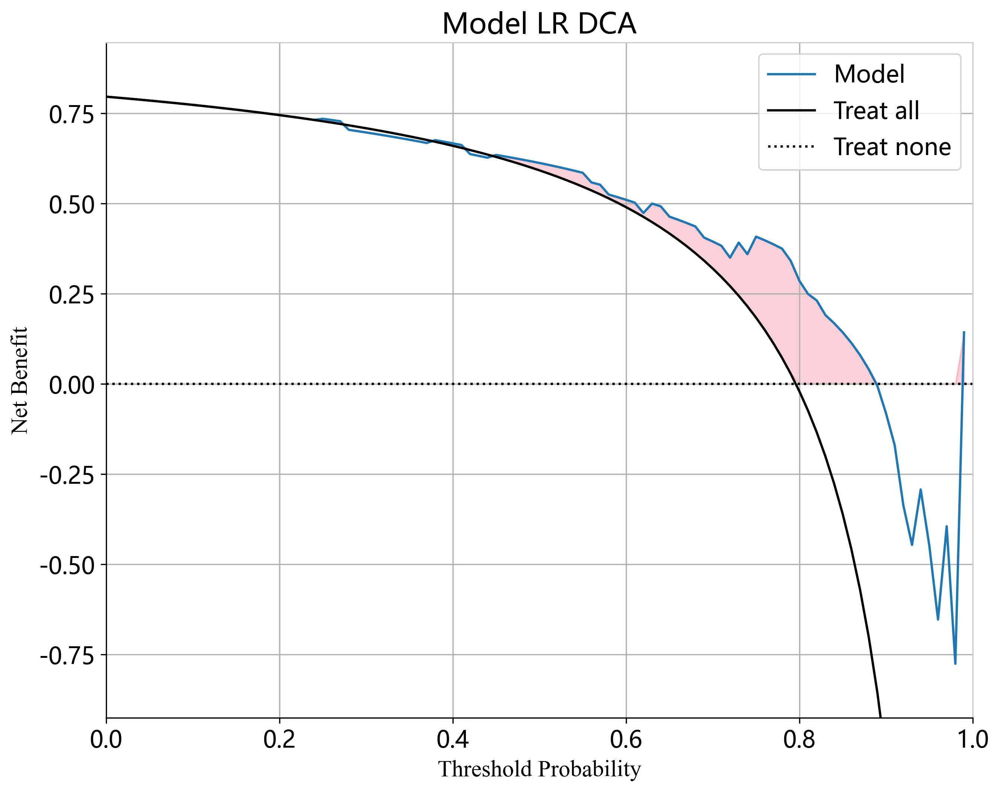

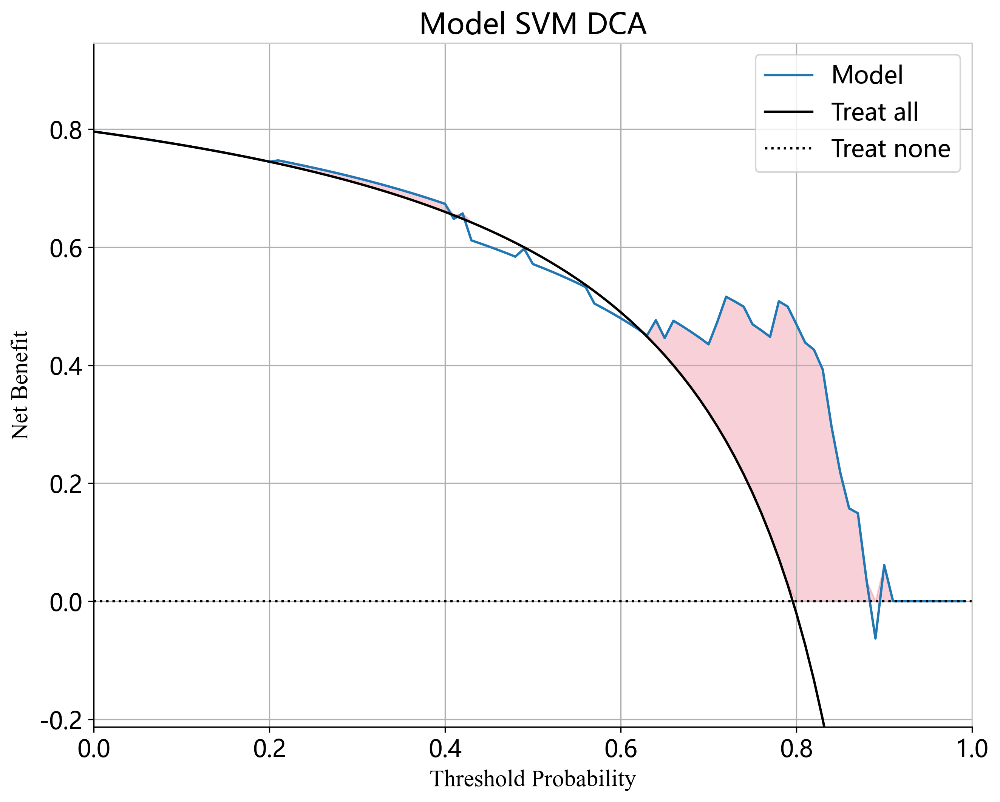

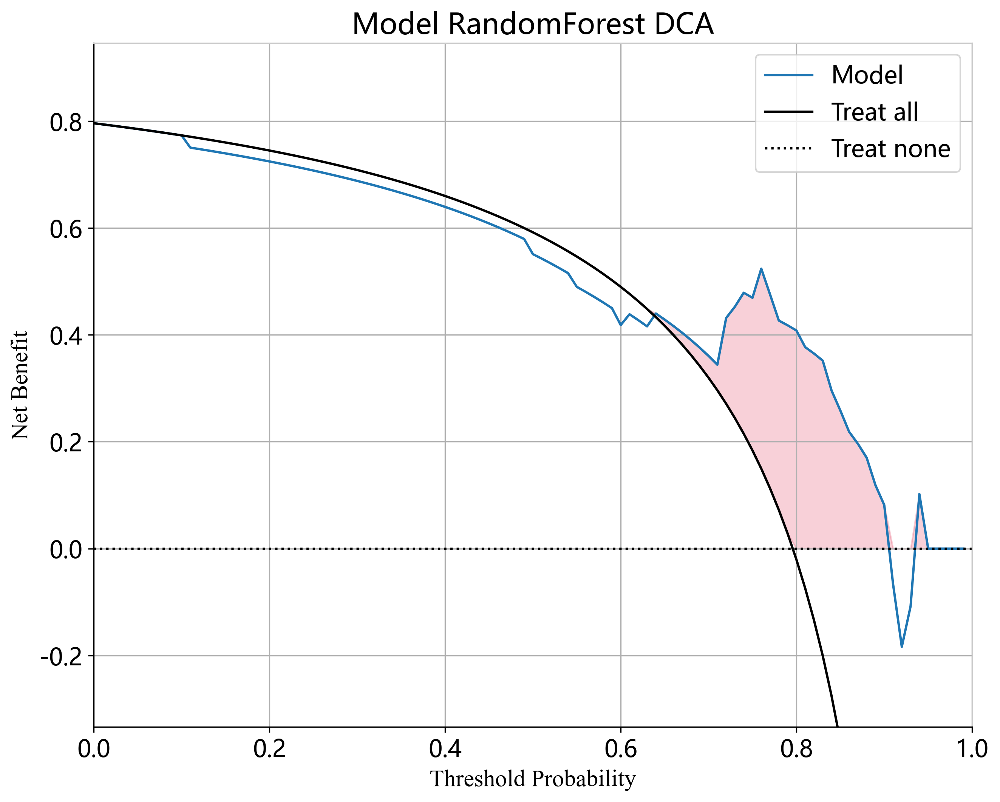

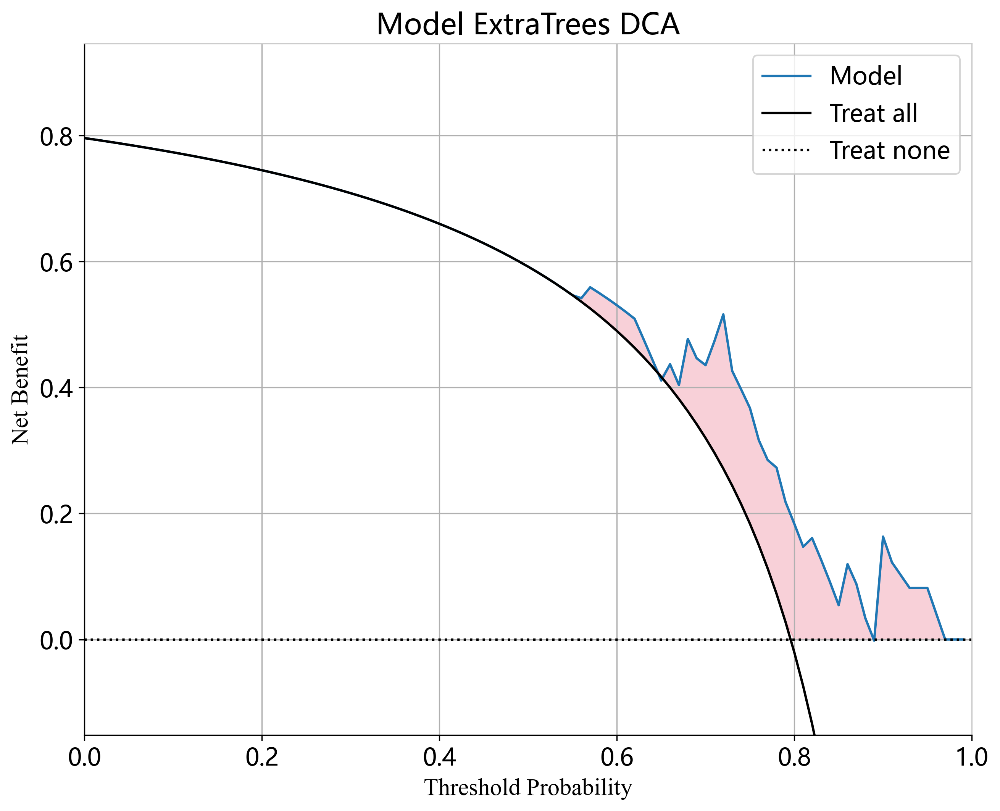

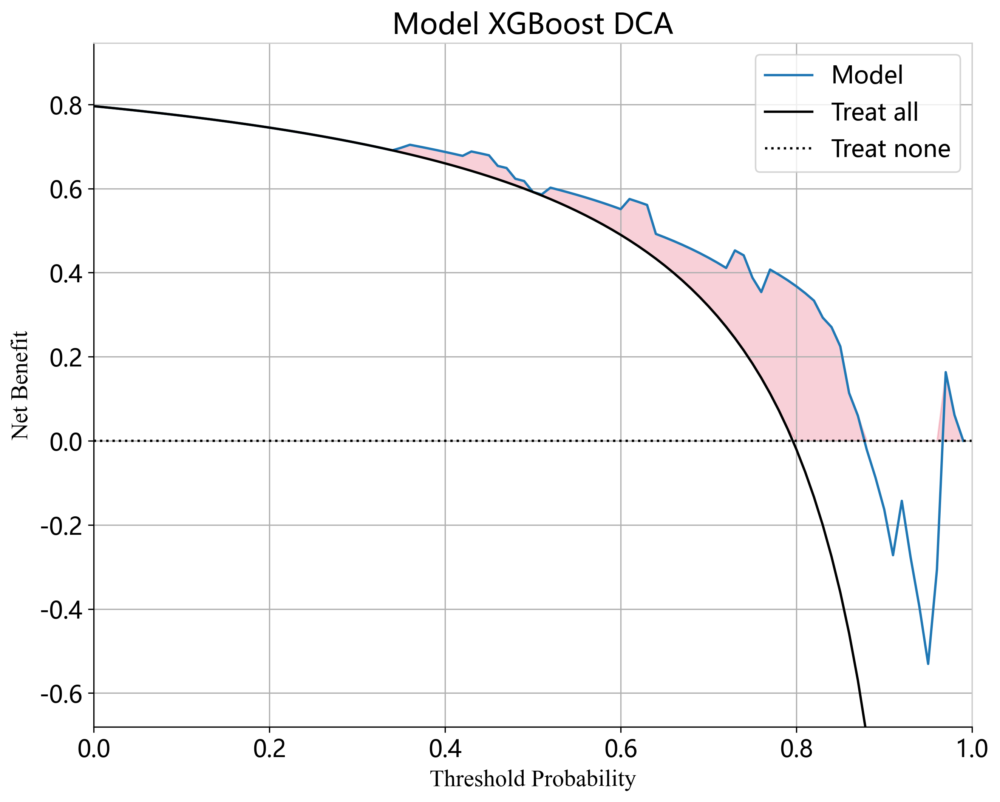

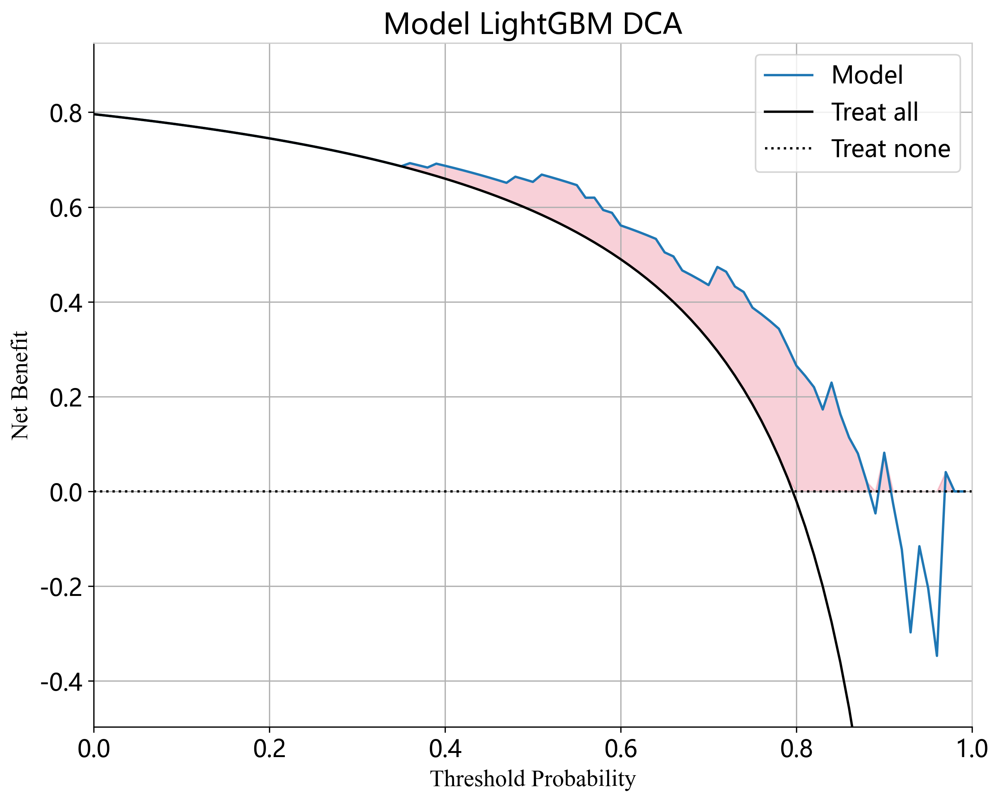

In [37]:
from onekey_algo.custom.components.comp1 import plot_DCA

for pred_score, label in zip(pred_scores, labels):
    pred_test_scores = []
    for sm in sel_model:
        if sm in model_names:
            sel_model_idx = model_names.index(sm)
            okcomp.comp1.plot_DCA(pred_score[sel_model_idx][-1][:,1], np.array(y_test_sel[label]),
                                  title=f'Model {sm} DCA')
            plt.savefig(f'img/Rad_model_test_{sm}_dca.svg', bbox_inches = 'tight')

### 绘制混淆矩阵

绘制混淆矩阵，[混淆矩阵解释](https://baike.baidu.com/item/%E6%B7%B7%E6%B7%86%E7%9F%A9%E9%98%B5/10087822?fr=aladdin)
`sel_model = ['SVM', 'KNN']`参数为想要绘制的模型对应的参数。

如果需要修改标签到名称的映射，修改`class_mapping={1:'1', 0:'0'}`

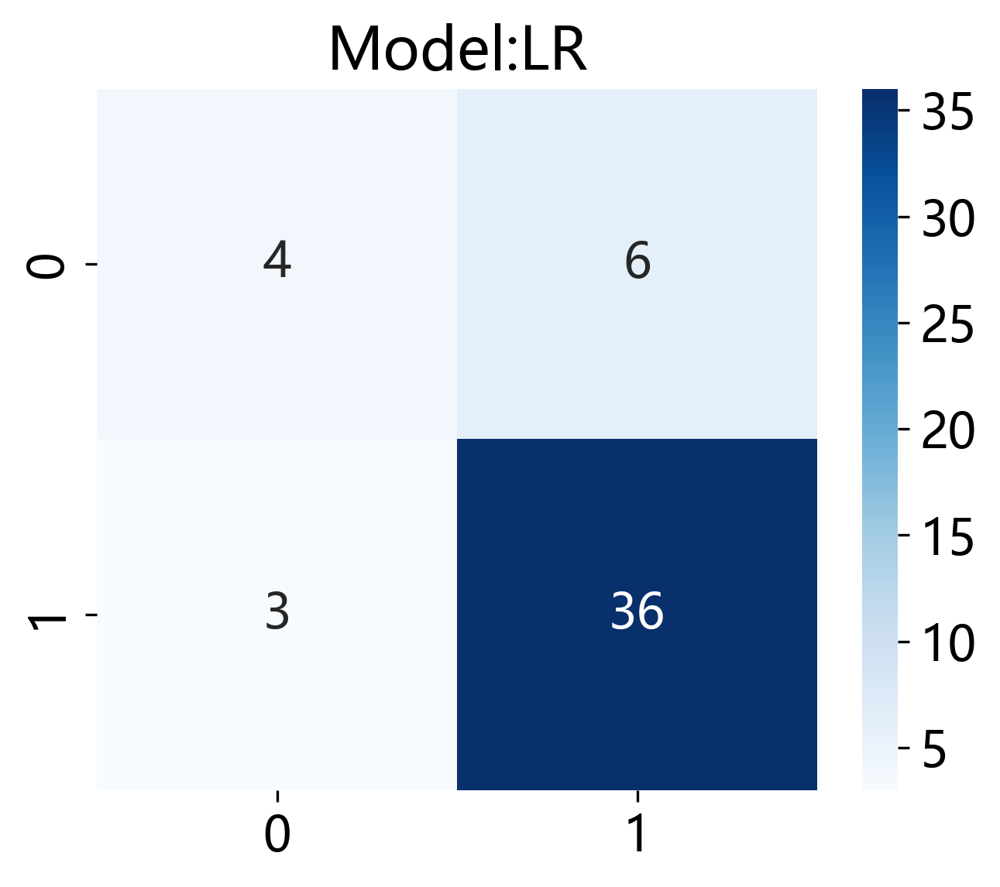

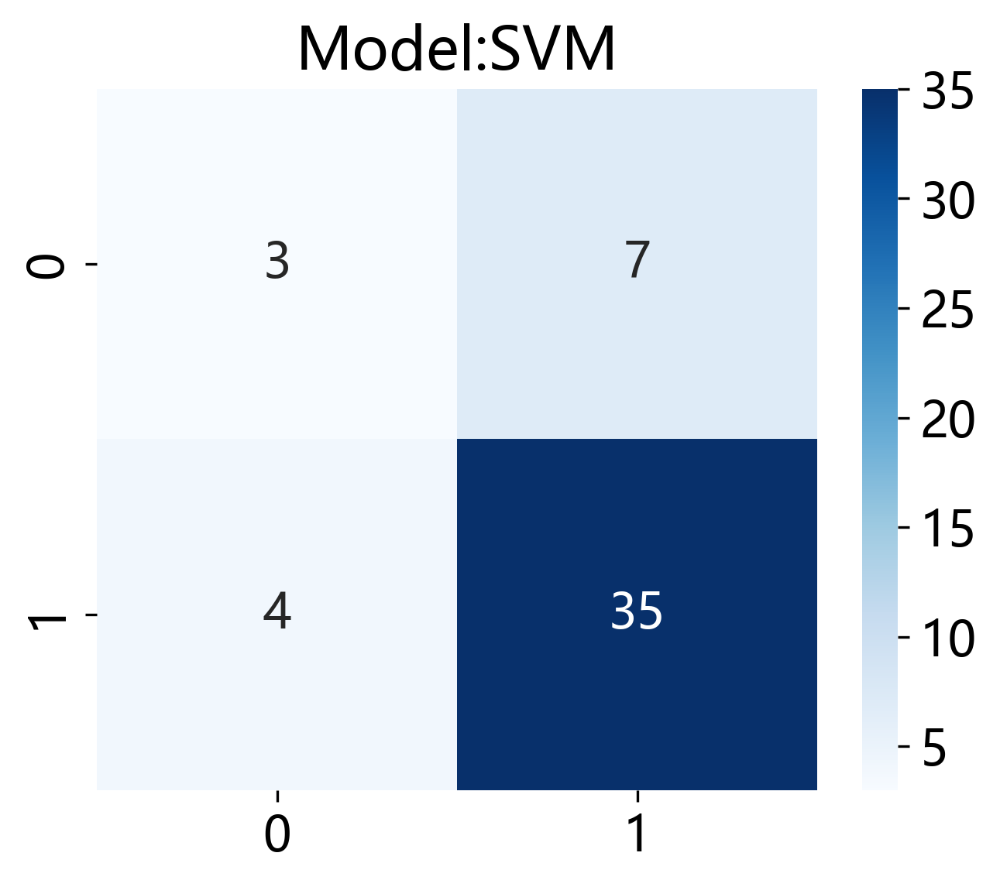

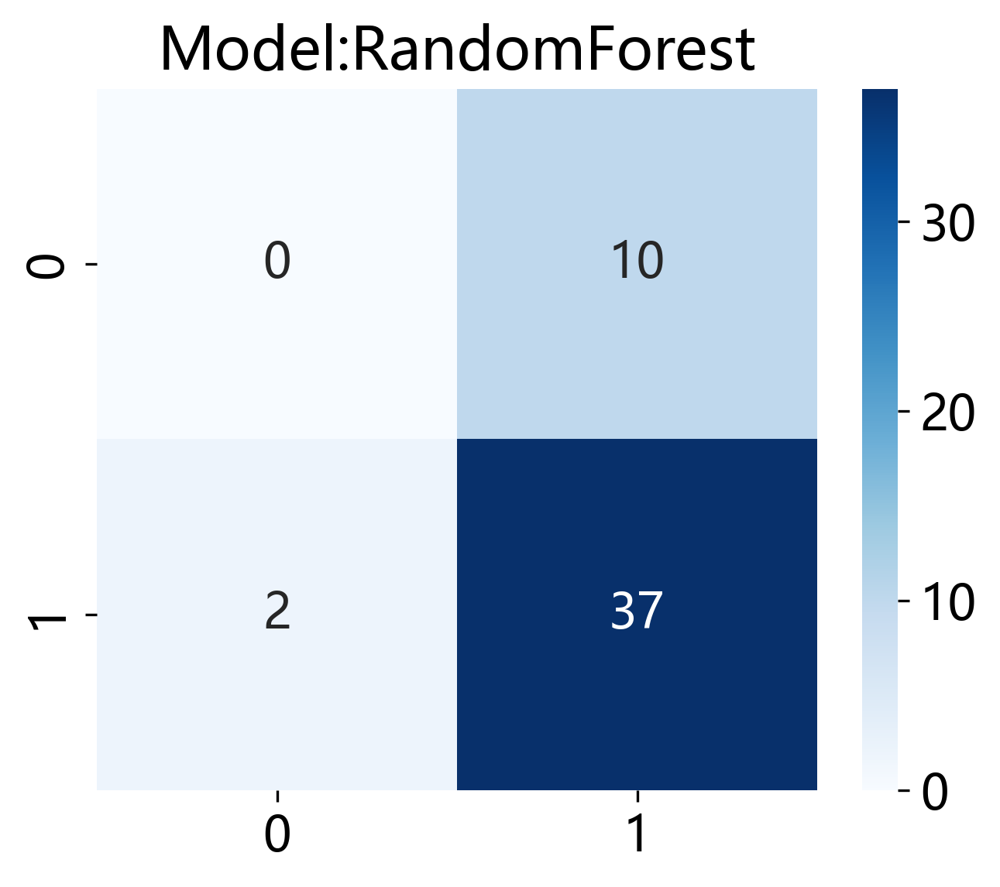

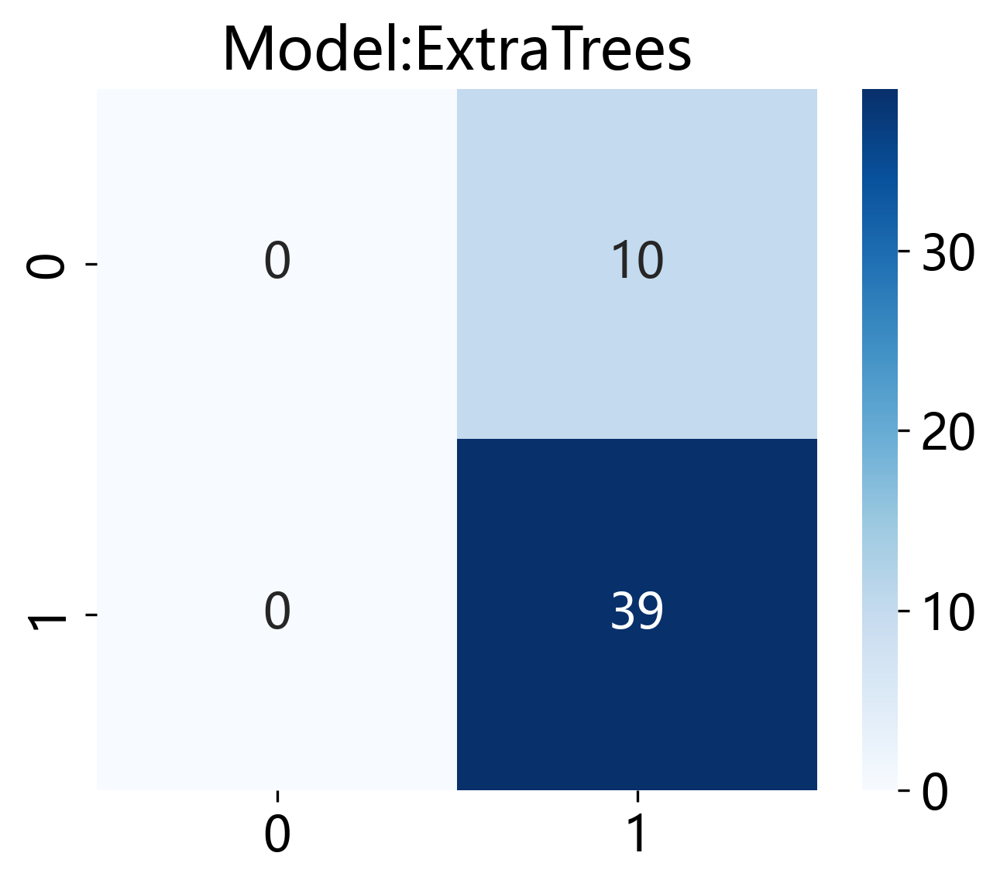

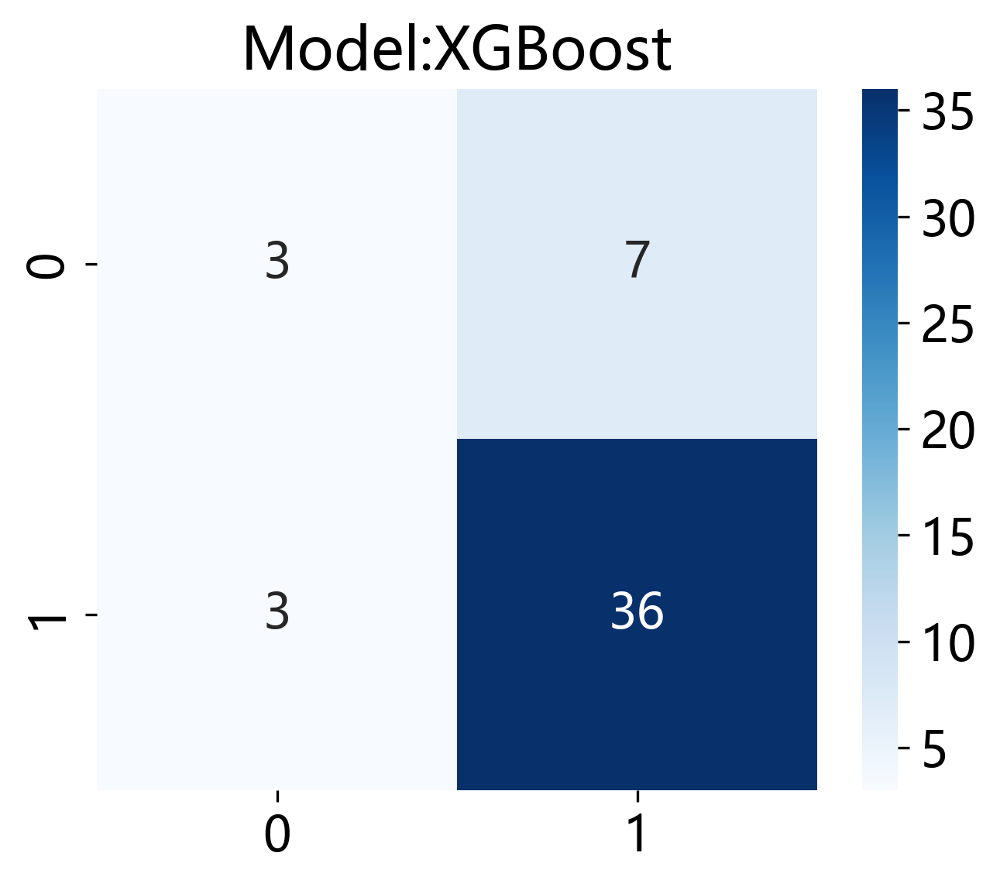

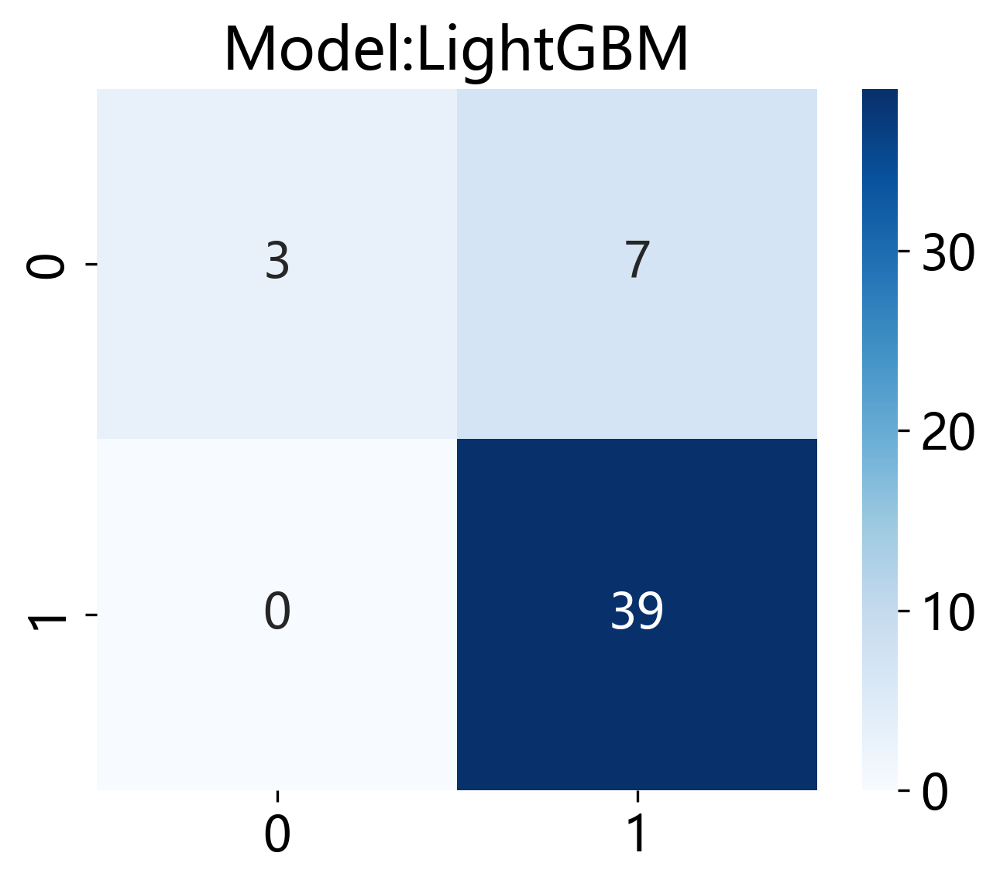

In [38]:
# 设置绘制参数
sel_model = model_names
c_matrix = {}

for sm in sel_model:
    if sm in model_names:
        sel_model_idx = model_names.index(sm)
        for idx, label in enumerate(labels):
            cm = okcomp.comp1.calc_confusion_matrix(predictions[idx][sel_model_idx][-1], y_test_sel[label],
#                                                     sel_idx = pred_sel_idx[idx][sel_model_idx],
                                                    class_mapping={1:'1', 0:'0'}, num_classes=2)
            c_matrix[label] = cm
            plt.figure(figsize=(5, 4))
            plt.title(f'Model:{sm}')
            okcomp.comp1.draw_matrix(cm, norm=False, annot=True, cmap='Blues', fmt='.0f')
            plt.savefig(f'img/Rad_model_test_{sm}_cm.svg', bbox_inches = 'tight')

### 样本预测直方图

绘制每个样本的预测结果以及对应的真实结果, 图例中label=xx可以修改成自己类别的真实标签。

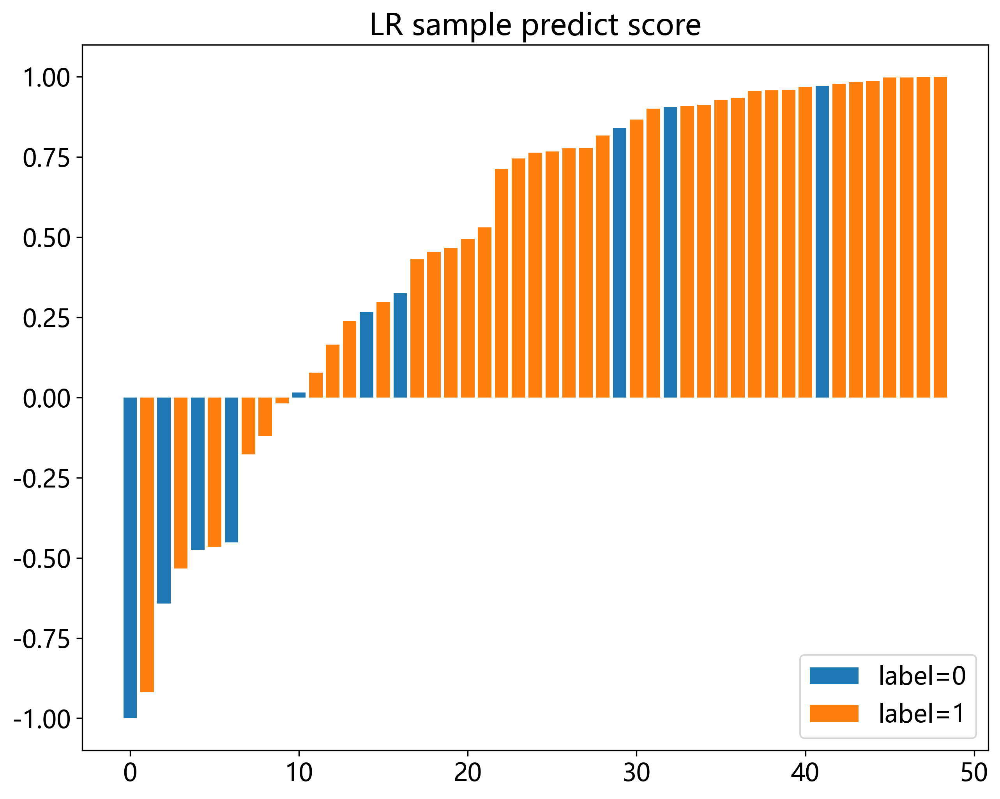

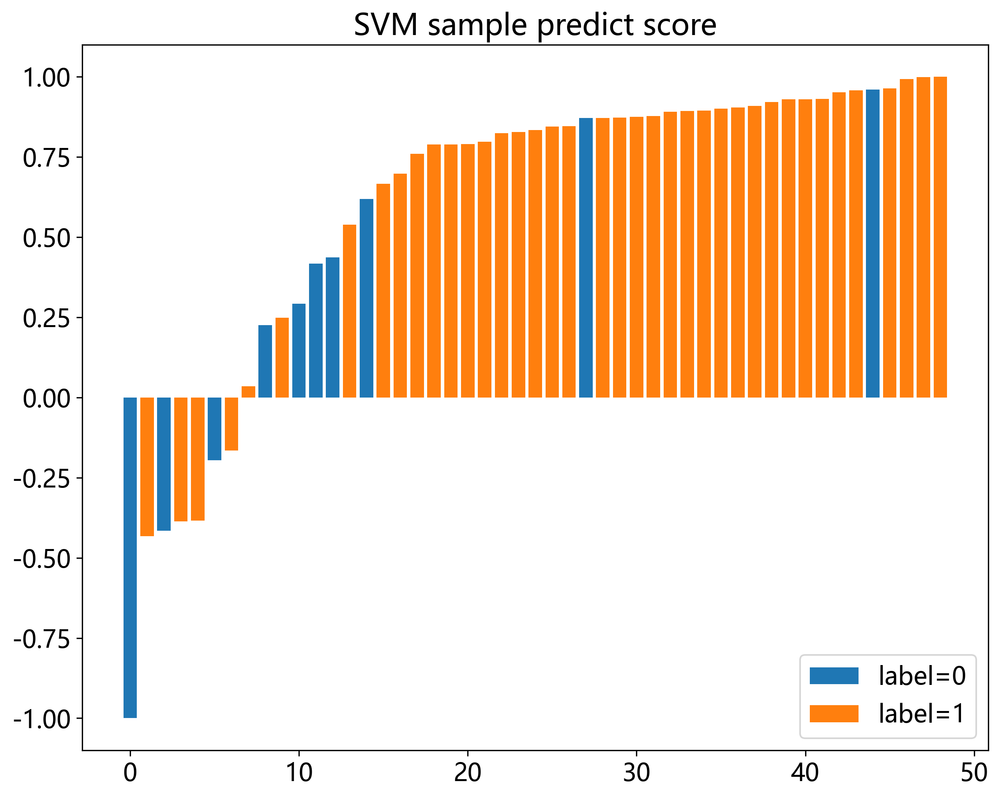

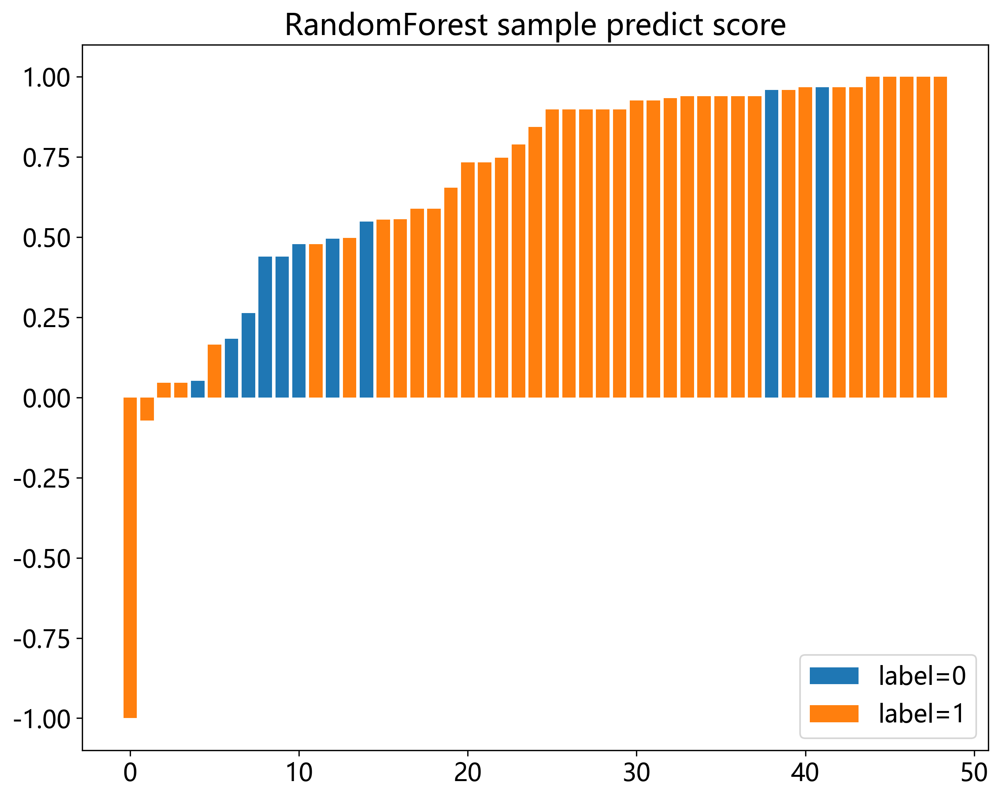

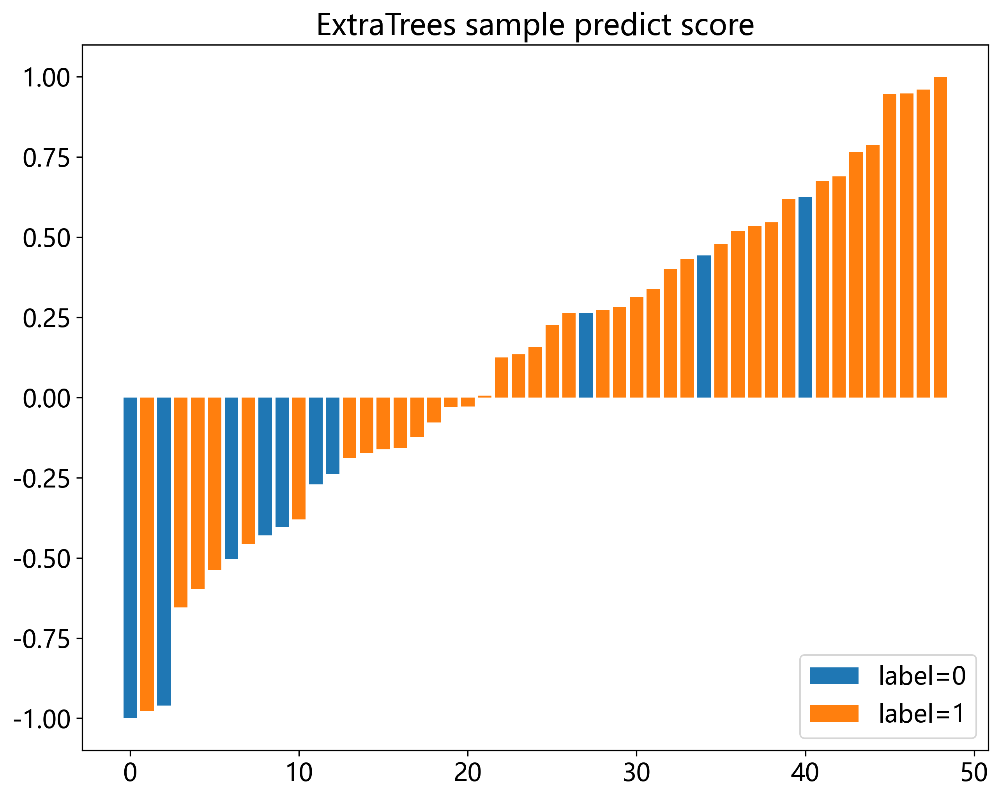

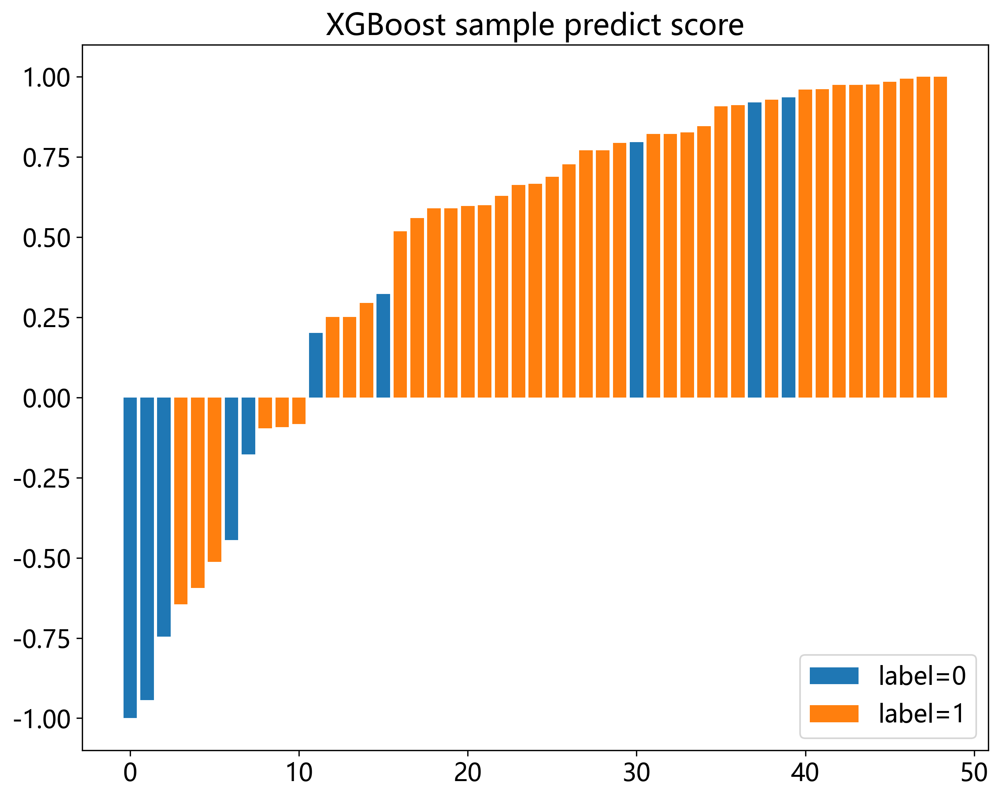

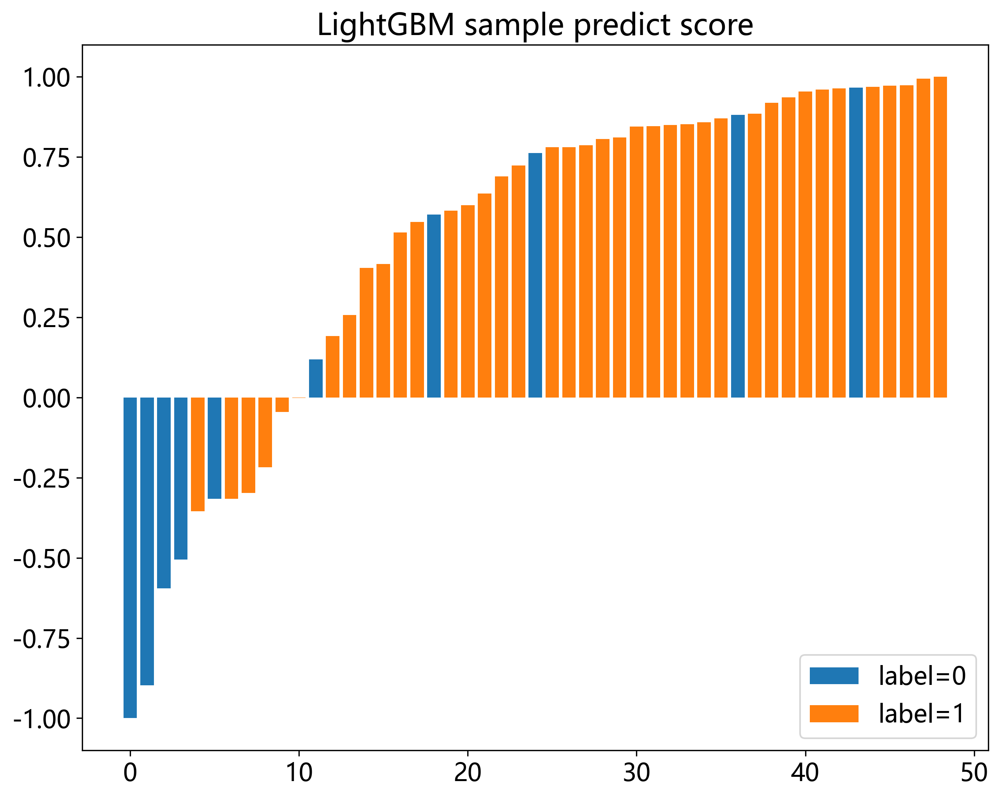

In [39]:
sel_model = model_names
c_matrix = {}

for sm in sel_model:
    if sm in model_names:
        sel_model_idx = model_names.index(sm)
        for idx, label in enumerate(labels):            
            okcomp.comp1.draw_predict_score(pred_scores[idx][sel_model_idx][-1], y_test_sel[label])
            plt.title(f'{sm} sample predict score')
            plt.legend(labels=["label=0", "label=1"],loc="lower right") 
            plt.savefig(f'img/Rad_test_{sm}_sample_dis.svg', bbox_inches = 'tight')
            plt.show()

## 保存模型结果

可以把模型预测的标签结果以及每个类别的概率都保存下来。

In [40]:
import os
import numpy as np

os.makedirs('results', exist_ok=True)
sel_model = sel_model

for idx, label in enumerate(labels):
    for sm in sel_model:
        if sm in model_names:
            sel_model_idx = model_names.index(sm)
            target = targets[idx][sel_model_idx]
            # 预测训练集和测试集数据。
            train_indexes = np.reshape(np.array(train_ids), (-1, 1)).astype(str)
            test_indexes = np.reshape(np.array(test_ids), (-1, 1)).astype(str)
            y_train_pred_scores = target.predict_proba(X_train_sel)
            y_test_pred_scores = target.predict_proba(X_test_sel)
            columns = ['ID'] + [f"{label}-{i}"for i in range(y_test_pred_scores.shape[1])]
            # 保存预测的训练集和测试集结果
            result_train = pd.DataFrame(np.concatenate([train_indexes, y_train_pred_scores], axis=1), columns=columns)
            result_train.to_csv(f'results/Rad_{sm}_train.csv', index=False)
            result_test = pd.DataFrame(np.concatenate([test_indexes, y_test_pred_scores], axis=1), columns=columns)
            result_test.to_csv(f'results/Rad_{sm}_test.csv', index=False)